In [1]:
import cartopy.feature as cfeature
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.dates as mdates
import xarray as xr
import pandas as pd
import numpy as np

from mpl_toolkits.axes_grid1 import make_axes_locatable
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from matplotlib.ticker import AutoMinorLocator
from cartopy.util import add_cyclic_point
from matplotlib import rcParams
import matplotlib.colors as mcolors
from matplotlib.gridspec import GridSpec
from cartopy.util import add_cyclic_point
from scipy.stats import linregress

import cftime
from datetime import datetime

import regionmask

## Historical Data

In [2]:
data1 = '/Users/samuel/Pictures/CM_Modelling_Python/UKESM1 Summary Files/1981-2010_Climatology/Historical/UKESM1_historical_1981-2010.cvdp_data.1850-2014.nc'

In [3]:
hist = xr.open_dataset(data1)
hist

<xarray.Dataset> Size: 61MB
Dimensions:                         (LAT: 144, LON: 192, TIME: 165, lat: 144,
                                     lon: 192, ncurves: 4, frequency: 990,
                                     time: 1980, hov_lon: 85, i: 360, i2: 360,
                                     j: 330, j2: 330, period: 132,
                                     time_mon2: 12, bnds: 2, vertices: 4)
Coordinates: (12/17)
  * LAT                             (LAT) float64 1kB -89.38 -88.12 ... 89.38
  * LON                             (LON) float64 2kB 0.9375 2.812 ... 359.1
  * TIME                            (TIME) int32 660B 1850 1851 ... 2013 2014
  * frequency                       (frequency) float32 4kB 0.0005051 ... 0.5
  * hov_lon                         (hov_lon) float64 680B 120.9 122.8 ... 278.4
  * i                               (i) int32 1kB 0 1 2 3 4 ... 356 357 358 359
    ...                              ...
  * ncurves                         (ncurves) int32 16B 0 1 2 3
  * period                          (period) float32 528B 0.08609 ... 166.4
  * time                            (time) object 16kB 1850-01-16 00:00:00 .....
  * time_mon2                       (time_mon2) object 96B 0000-01-01 00:00:0...
    latitude                        (j, i) float32 475kB ...
    longitude                       (j, i) float32 475kB ...
Dimensions without coordinates: bnds, vertices
Data variables: (12/582)
    amm_pattern_mon                 (lat, lon) float32 111kB ...
    amm_pr_regression_mon           (lat, lon) float32 111kB ...
    amm_spectra                     (ncurves, frequency) float32 16kB ...
    amm_tas_regression_mon          (lat, lon) float32 111kB ...
    amm_timeseries_mon              (time) float32 8kB ...
    amo_pattern_lowpass_mon         (lat, lon) float32 111kB ...
    ...                              ...
    sic_sh_trends_mam               (j, i) float32 475kB ...
    sic_sh_trends_mon               (j, i) float32 475kB ...
    sic_sh_trends_son               (j, i) float32 475kB ...
    time_bnds                       (time, bnds) object 32kB ...
    vertices_latitude               (j, i, vertices) float32 2MB ...
    vertices_longitude              (j, i, vertices) float32 2MB ...
Attributes: (12/51)
    source:                    UKESM1.0-LL (2018): \naerosol: UKCA-GLOMAP-mod...
    notes:                     Data from UKESM1 historical 1981-2010 from 185...
    climatology:               1981-2010 climatology removed prior to all cal...
    Conventions:               CF-1.7 CMIP-6.2
    history:                   Sun Jan 31 21:31:35 2021: ncatted -a calendar,...
    NCO:                       netCDF Operators version 4.7.5 (Homepage = htt...
    ...                        ...
    variable_id:               tas
    variant_label:             r1i1p1f2
    license:                   CMIP6 model data produced by the Met Office Ha...
    cmor_version:              3.4.0
    tracking_id:               hdl:21.14100/255d149c-12fc-41f1-878d-0344c8b797f4
    nco_openmp_thread_number:  1

## SSP Data for When Comparing to Historical 

In [4]:
# ssp126
data2 = '/Users/samuel/Pictures/CM_Modelling_Python/UKESM1 Summary Files/1981-2010_Climatology/SSP126/UKESM1_ssp126_1981-2010.cvdp_data.1850-2100.nc'

In [5]:
ssp126hist = xr.open_dataset(data2)
ssp126hist

<xarray.Dataset> Size: 63MB
Dimensions:                         (LAT: 144, LON: 192, TIME: 251, lat: 144,
                                     lon: 192, ncurves: 4, frequency: 1506,
                                     time: 3012, hov_lon: 85, i: 360, i2: 360,
                                     j: 330, j2: 330, period: 139,
                                     time_mon2: 12, bnds: 2, vertices: 4)
Coordinates: (12/17)
  * LAT                             (LAT) float64 1kB -89.38 -88.12 ... 89.38
  * LON                             (LON) float64 2kB 0.9375 2.812 ... 359.1
  * TIME                            (TIME) int32 1kB 1850 1851 ... 2099 2100
  * frequency                       (frequency) float32 6kB 0.000332 ... 0.5
  * hov_lon                         (hov_lon) float64 680B 120.9 122.8 ... 278.4
  * i                               (i) int32 1kB 0 1 2 3 4 ... 356 357 358 359
    ...                              ...
  * ncurves                         (ncurves) int32 16B 0 1 2 3
  * period                          (period) float32 556B 0.08609 ... 249.3
  * time                            (time) object 24kB 1850-01-16 00:00:00 .....
  * time_mon2                       (time_mon2) object 96B 0000-01-01 00:00:0...
    latitude                        (j, i) float32 475kB ...
    longitude                       (j, i) float32 475kB ...
Dimensions without coordinates: bnds, vertices
Data variables: (12/582)
    amm_pattern_mon                 (lat, lon) float32 111kB ...
    amm_pr_regression_mon           (lat, lon) float32 111kB ...
    amm_spectra                     (ncurves, frequency) float32 24kB ...
    amm_tas_regression_mon          (lat, lon) float32 111kB ...
    amm_timeseries_mon              (time) float32 12kB ...
    amo_pattern_lowpass_mon         (lat, lon) float32 111kB ...
    ...                              ...
    sic_sh_trends_mam               (j, i) float32 475kB ...
    sic_sh_trends_mon               (j, i) float32 475kB ...
    sic_sh_trends_son               (j, i) float32 475kB ...
    time_bnds                       (time, bnds) object 48kB ...
    vertices_latitude               (j, i, vertices) float32 2MB ...
    vertices_longitude              (j, i, vertices) float32 2MB ...
Attributes: (12/51)
    source:                    UKESM1.0-LL (2018): \naerosol: UKCA-GLOMAP-mod...
    notes:                     Data from UKESM1 ssp126 1981-2010 from 1850-2100
    climatology:               1981-2010 climatology removed prior to all cal...
    Conventions:               CF-1.7 CMIP-6.2
    history:                   Sun Jan 31 21:31:58 2021: ncatted -a calendar,...
    NCO:                       netCDF Operators version 4.7.5 (Homepage = htt...
    ...                        ...
    variable_id:               tas
    variant_label:             r1i1p1f2
    license:                   CMIP6 model data produced by the Met Office Ha...
    cmor_version:              3.4.0
    tracking_id:               hdl:21.14100/255d149c-12fc-41f1-878d-0344c8b797f4
    nco_openmp_thread_number:  1

In [6]:
# ssp585
data3 = '/Users/samuel/Pictures/CM_Modelling_Python/UKESM1 Summary Files/1981-2010_Climatology/SSP585/UKESM1_ssp585_1981-2010.cvdp_data.1850-2100.nc'

In [7]:
ssp585hist = xr.open_dataset(data3)
ssp585hist

<xarray.Dataset> Size: 63MB
Dimensions:                         (LAT: 144, LON: 192, TIME: 251, lat: 144,
                                     lon: 192, ncurves: 4, frequency: 1506,
                                     time: 3012, hov_lon: 85, i: 360, i2: 360,
                                     j: 330, j2: 330, period: 139,
                                     time_mon2: 12, bnds: 2, vertices: 4)
Coordinates: (12/17)
  * LAT                             (LAT) float64 1kB -89.38 -88.12 ... 89.38
  * LON                             (LON) float64 2kB 0.9375 2.812 ... 359.1
  * TIME                            (TIME) int32 1kB 1850 1851 ... 2099 2100
  * frequency                       (frequency) float32 6kB 0.000332 ... 0.5
  * hov_lon                         (hov_lon) float64 680B 120.9 122.8 ... 278.4
  * i                               (i) int32 1kB 0 1 2 3 4 ... 356 357 358 359
    ...                              ...
  * ncurves                         (ncurves) int32 16B 0 1 2 3
  * period                          (period) float32 556B 0.08609 ... 249.3
  * time                            (time) object 24kB 1850-01-16 00:00:00 .....
  * time_mon2                       (time_mon2) object 96B 0000-01-01 00:00:0...
    latitude                        (j, i) float32 475kB ...
    longitude                       (j, i) float32 475kB ...
Dimensions without coordinates: bnds, vertices
Data variables: (12/582)
    amm_pattern_mon                 (lat, lon) float32 111kB ...
    amm_pr_regression_mon           (lat, lon) float32 111kB ...
    amm_spectra                     (ncurves, frequency) float32 24kB ...
    amm_tas_regression_mon          (lat, lon) float32 111kB ...
    amm_timeseries_mon              (time) float32 12kB ...
    amo_pattern_lowpass_mon         (lat, lon) float32 111kB ...
    ...                              ...
    sic_sh_trends_mam               (j, i) float32 475kB ...
    sic_sh_trends_mon               (j, i) float32 475kB ...
    sic_sh_trends_son               (j, i) float32 475kB ...
    time_bnds                       (time, bnds) object 48kB ...
    vertices_latitude               (j, i, vertices) float32 2MB ...
    vertices_longitude              (j, i, vertices) float32 2MB ...
Attributes: (12/51)
    source:                    UKESM1.0-LL (2018): \naerosol: UKCA-GLOMAP-mod...
    notes:                     Data from UKESM1 ssp585 1981-2010 from 1850-2100
    climatology:               1981-2010 climatology removed prior to all cal...
    Conventions:               CF-1.7 CMIP-6.2
    history:                   Sun Jan 31 21:33:39 2021: ncatted -a calendar,...
    NCO:                       netCDF Operators version 4.7.5 (Homepage = htt...
    ...                        ...
    variable_id:               tas
    variant_label:             r1i1p1f2
    license:                   CMIP6 model data produced by the Met Office Ha...
    cmor_version:              3.4.0
    tracking_id:               hdl:21.14100/255d149c-12fc-41f1-878d-0344c8b797f4
    nco_openmp_thread_number:  1

## SSP Data for Mean Averages (2071-2100)

In [8]:
# ssp126
data4 = '/Users/samuel/Pictures/CM_Modelling_Python/UKESM1 Summary Files/2071-2100_Climatology/SSP126/UKESM1_ssp126_2071-2100.cvdp_data.1850-2100.nc'

In [9]:
ssp126mean = xr.open_dataset(data4)
ssp126mean

<xarray.Dataset> Size: 64MB
Dimensions:                         (LAT: 144, LON: 192, TIME: 251, lat: 144,
                                     lon: 192, ncurves: 4, frequency: 1506,
                                     time: 3012, lev: 75, lat_amoc: 330,
                                     frequency2: 125, hov_lon: 85, i: 360,
                                     i2: 360, j: 330, j2: 330, period: 139,
                                     time_mon2: 12, bnds: 2, vertices: 4)
Coordinates: (12/20)
  * LAT                             (LAT) float64 1kB -89.38 -88.12 ... 89.38
  * LON                             (LON) float64 2kB 0.9375 2.812 ... 359.1
  * TIME                            (TIME) int32 1kB 1850 1851 ... 2099 2100
  * frequency                       (frequency) float32 6kB 0.000332 ... 0.5
  * frequency2                      (frequency2) float32 500B 0.003984 ... 0.498
  * hov_lon                         (hov_lon) float64 680B 120.9 122.8 ... 278.4
    ...                              ...
  * ncurves                         (ncurves) int32 16B 0 1 2 3
  * period                          (period) float32 556B 0.08609 ... 249.3
  * time                            (time) object 24kB 1850-01-16 00:00:00 .....
  * time_mon2                       (time_mon2) object 96B 0000-01-01 00:00:0...
    latitude                        (j, i) float32 475kB ...
    longitude                       (j, i) float32 475kB ...
Dimensions without coordinates: bnds, vertices
Data variables: (12/589)
    amm_pattern_mon                 (lat, lon) float32 111kB ...
    amm_pr_regression_mon           (lat, lon) float32 111kB ...
    amm_spectra                     (ncurves, frequency) float32 24kB ...
    amm_tas_regression_mon          (lat, lon) float32 111kB ...
    amm_timeseries_mon              (time) float32 12kB ...
    amo_pattern_lowpass_mon         (lat, lon) float32 111kB ...
    ...                              ...
    sic_sh_trends_mam               (j, i) float32 475kB ...
    sic_sh_trends_mon               (j, i) float32 475kB ...
    sic_sh_trends_son               (j, i) float32 475kB ...
    time_bnds                       (time, bnds) object 48kB ...
    vertices_latitude               (j, i, vertices) float32 2MB ...
    vertices_longitude              (j, i, vertices) float32 2MB ...
Attributes: (12/51)
    source:                    UKESM1.0-LL (2018): \naerosol: UKCA-GLOMAP-mod...
    notes:                     Data from UKESM1 ssp126 2071-2100 from 1850-2100
    climatology:               2071-2100 climatology removed prior to all cal...
    Conventions:               CF-1.7 CMIP-6.2
    history:                   Sun Jan 31 21:32:10 2021: ncatted -a calendar,...
    NCO:                       netCDF Operators version 4.7.5 (Homepage = htt...
    ...                        ...
    variable_id:               tas
    variant_label:             r1i1p1f2
    license:                   CMIP6 model data produced by the Met Office Ha...
    cmor_version:              3.4.0
    tracking_id:               hdl:21.14100/255d149c-12fc-41f1-878d-0344c8b797f4
    nco_openmp_thread_number:  1

In [10]:
# ssp585
data5 = '/Users/samuel/Pictures/CM_Modelling_Python/UKESM1 Summary Files/2071-2100_Climatology/SSP585/UKESM1_ssp585_2071-2100.cvdp_data.1850-2100.nc'

In [11]:
ssp585mean = xr.open_dataset(data5)
ssp585mean

<xarray.Dataset> Size: 64MB
Dimensions:                         (LAT: 144, LON: 192, TIME: 251, lat: 144,
                                     lon: 192, ncurves: 4, frequency: 1506,
                                     time: 3012, lev: 75, lat_amoc: 330,
                                     frequency2: 125, hov_lon: 85, i: 360,
                                     i2: 360, j: 330, j2: 330, period: 139,
                                     time_mon2: 12, bnds: 2, vertices: 4)
Coordinates: (12/20)
  * LAT                             (LAT) float64 1kB -89.38 -88.12 ... 89.38
  * LON                             (LON) float64 2kB 0.9375 2.812 ... 359.1
  * TIME                            (TIME) int32 1kB 1850 1851 ... 2099 2100
  * frequency                       (frequency) float32 6kB 0.000332 ... 0.5
  * frequency2                      (frequency2) float32 500B 0.003984 ... 0.498
  * hov_lon                         (hov_lon) float64 680B 120.9 122.8 ... 278.4
    ...                              ...
  * ncurves                         (ncurves) int32 16B 0 1 2 3
  * period                          (period) float32 556B 0.08609 ... 249.3
  * time                            (time) object 24kB 1850-01-16 00:00:00 .....
  * time_mon2                       (time_mon2) object 96B 0000-01-01 00:00:0...
    latitude                        (j, i) float32 475kB ...
    longitude                       (j, i) float32 475kB ...
Dimensions without coordinates: bnds, vertices
Data variables: (12/589)
    amm_pattern_mon                 (lat, lon) float32 111kB ...
    amm_pr_regression_mon           (lat, lon) float32 111kB ...
    amm_spectra                     (ncurves, frequency) float32 24kB ...
    amm_tas_regression_mon          (lat, lon) float32 111kB ...
    amm_timeseries_mon              (time) float32 12kB ...
    amo_pattern_lowpass_mon         (lat, lon) float32 111kB ...
    ...                              ...
    sic_sh_trends_mam               (j, i) float32 475kB ...
    sic_sh_trends_mon               (j, i) float32 475kB ...
    sic_sh_trends_son               (j, i) float32 475kB ...
    time_bnds                       (time, bnds) object 48kB ...
    vertices_latitude               (j, i, vertices) float32 2MB ...
    vertices_longitude              (j, i, vertices) float32 2MB ...
Attributes: (12/51)
    source:                    UKESM1.0-LL (2018): \naerosol: UKCA-GLOMAP-mod...
    notes:                     Data from UKESM1 ssp585 2071-2100 from 1850-2100
    climatology:               2071-2100 climatology removed prior to all cal...
    Conventions:               CF-1.7 CMIP-6.2
    history:                   Sun Jan 31 21:33:51 2021: ncatted -a calendar,...
    NCO:                       netCDF Operators version 4.7.5 (Homepage = htt...
    ...                        ...
    variable_id:               tas
    variant_label:             r1i1p1f2
    license:                   CMIP6 model data produced by the Met Office Ha...
    cmor_version:              3.4.0
    tracking_id:               hdl:21.14100/255d149c-12fc-41f1-878d-0344c8b797f4
    nco_openmp_thread_number:  1

# Figure 1: Plotting SST and SIE, SAM and SIE - Historical Timeseries

In [12]:
# SIE
sic_var1 = 'sic_sh_extent_ann'
sie_hist = hist[sic_var1]
sie_hist

<xarray.DataArray 'sic_sh_extent_ann' (TIME: 165)> Size: 660B
[165 values with dtype=float32]
Coordinates:
  * TIME     (TIME) int32 660B 1850 1851 1852 1853 1854 ... 2011 2012 2013 2014
Attributes:
    i:               0
    j:               0
    standard_name:   sea_ice_area_fraction
    long_name:       Southern Hemisphere sic extent timeseries (annual)
    comment:         Area fraction of grid cell covered by sea ice
    units:           10^12 m2
    original_name:   mo: (variable_name: aice)
    original_units:  1
    history:         2019-04-05T15:48:59Z altered by CMOR: Converted units fr...

In [475]:
# SST
sst_var1 = 'tas_global_avg_ann'
sst_hist = hist[sst_var1]
sst_hist

<xarray.DataArray 'tas_global_avg_ann' (TIME: 165)> Size: 660B
array([-0.384865, -0.376425, -0.27222 , -0.221818, -0.300677, -0.429752,
       -0.236411, -0.216474, -0.234678, -0.195872, -0.271243, -0.174172,
       -0.257721, -0.228397, -0.246331, -0.435201, -0.356168, -0.332126,
       -0.374594, -0.555876, -0.661987, -0.480703, -0.206503, -0.165547,
       -0.373632, -0.409799, -0.372095, -0.241977, -0.104179, -0.292253,
       -0.286828, -0.366776, -0.289851, -0.240872, -0.541503, -0.584175,
       -0.509077, -0.410594, -0.25066 , -0.298276, -0.340015, -0.130331,
       -0.14505 , -0.437647, -0.378669, -0.308795, -0.231994, -0.36084 ,
       -0.324931, -0.40321 , -0.323969, -0.478664, -0.351234, -0.357694,
       -0.465023, -0.406269, -0.425832, -0.261664, -0.296092, -0.344719,
       -0.373674, -0.324405, -0.412261, -0.329676, -0.21658 , -0.201542,
       -0.324031, -0.423353, -0.315509, -0.185274, -0.296917, -0.437372,
       -0.429219, -0.405801, -0.236279, -0.24643 , -0.275385, -0.425086,
       -0.341766, -0.352986, -0.256906, -0.440265, -0.396853, -0.375547,
       -0.431389, -0.391961, -0.2439  , -0.534442, -0.552416, -0.372428,
       -0.475606, -0.399707, -0.231222, -0.428653, -0.294415, -0.44405 ,
       -0.371463, -0.265623, -0.305771, -0.506214, -0.545034, -0.533344,
       -0.453542, -0.413158, -0.127634, -0.315082, -0.242545, -0.291405,
       -0.193636, -0.340834, -0.32224 , -0.415578, -0.261032, -0.501755,
       -0.784631, -0.590321, -0.491634, -0.661667, -0.806845, -0.738739,
       -0.589602, -0.684351, -0.673689, -0.67386 , -0.696465, -0.551161,
       -0.527183, -0.576108, -0.465407, -0.547278, -0.592313, -0.474958,
       -0.43674 , -0.426884, -0.434158, -0.513955, -0.329412, -0.335683,
       -0.347487, -0.188896, -0.044767, -0.247722, -0.495283, -0.283004,
       -0.141563, -0.146623,  0.002043,  0.08287 ,  0.256061,  0.211944,
        0.288893,  0.31213 ,  0.43564 ,  0.318046,  0.315485,  0.369214,
        0.305633,  0.383002,  0.489169,  0.516724,  0.560281,  0.619973,
        0.573899,  0.656827,  0.714732], dtype=float32)
Coordinates:
  * TIME     (TIME) int32 660B 1850 1851 1852 1853 1854 ... 2011 2012 2013 2014
Attributes:
    long_name:  tas global area-average (annual)
    units:      C

In [476]:
# SAM
sam_var1 = 'sam_timeseries_ann'
sam_hist = hist[sam_var1]
sam_hist

<xarray.DataArray 'sam_timeseries_ann' (TIME: 165)> Size: 660B
array([ 0.583825, -0.323689, -0.313199, -1.378366,  1.667958, -0.853205,
       -0.5568  , -1.572144, -0.990432,  0.05841 , -1.68371 , -1.642423,
       -1.703437, -1.737822,  0.288204, -0.600907, -0.632327,  0.561775,
       -0.250843, -0.585042,  0.438159, -1.837972,  0.271989,  0.081544,
        0.340629,  1.286947, -0.342566, -0.722347, -0.332325, -0.311835,
        0.791492, -0.412118, -1.422642, -0.803176,  0.421305, -0.231694,
       -0.274646,  0.364621,  0.412101, -0.715485, -1.00869 , -1.514654,
        0.401275,  0.369266,  0.36383 , -1.274931, -0.74525 ,  0.352389,
       -0.050796,  0.179022, -0.471585,  0.336415, -1.616229, -0.960273,
       -1.016964,  0.368995,  0.260421, -0.063986,  1.071973,  0.034459,
        0.856691, -0.768247,  0.158019,  1.294528,  0.474814, -2.066652,
       -0.785632, -0.039923, -0.999432, -1.807315,  0.634603,  1.272623,
       -0.088126,  0.44138 , -1.173554, -0.142905,  0.074   , -0.194538,
       -1.308257,  0.067228,  1.015854,  0.365687, -1.00345 , -0.351442,
       -0.255574, -0.508   ,  1.1121  ,  0.354008,  0.476781,  0.344978,
        0.026423, -0.888618, -0.361769, -0.648086,  0.095639,  0.443255,
       -1.517643, -0.422167, -0.065677,  0.828948,  0.386697, -0.992855,
       -0.609679, -0.009939, -1.526036,  1.308295, -1.99741 ,  0.845182,
        0.688   ,  0.177148, -2.354779, -1.423213, -0.006754,  0.776728,
       -0.441347, -0.630218, -0.34321 ,  0.396697, -0.180259,  1.53434 ,
       -0.685165,  0.554719,  1.106269, -0.331066,  0.241581, -1.12802 ,
       -0.166762, -0.372567, -1.273354,  1.311077,  0.655587, -0.376805,
       -0.318393, -2.23548 , -0.932203,  1.28582 ,  1.047235,  0.624531,
       -0.08698 ,  0.696314, -1.064009,  2.880354,  1.226022,  1.456941,
        2.449847,  1.198041,  1.702147,  0.46995 ,  1.959853,  0.988487,
        1.456003,  0.618829,  1.160106,  0.916782,  1.096038,  1.15695 ,
        2.371444,  1.288738, -0.009419,  0.505434,  0.377778,  0.783981,
        1.651835,  0.659103,  2.191993], dtype=float32)
Coordinates:
  * TIME     (TIME) int32 660B 1850 1851 1852 1853 1854 ... 2011 2012 2013 2014
Attributes:
    long_name:  SAM normalized principal component timeseries (annual)
    units:      1

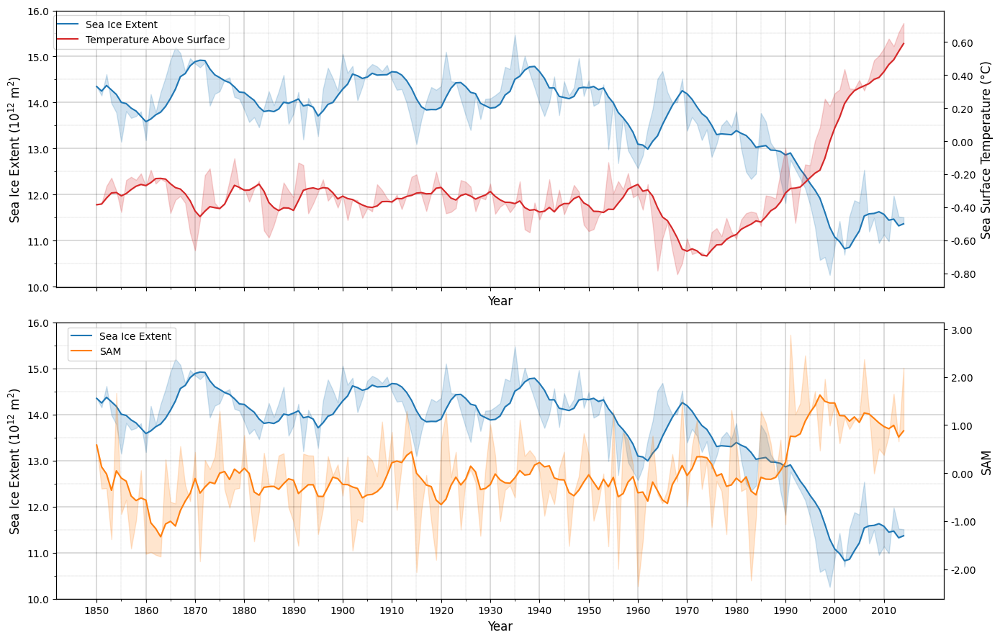

In [480]:
sie_smoothed = pd.Series(sie_hist).rolling(window=7, min_periods=1).mean()
sst_smoothed = pd.Series(sst_hist).rolling(window=7, min_periods=1).mean()
sam_smoothed = pd.Series(sam_hist).rolling(window=7, min_periods=1).mean()

# subplots
fig, axs = plt.subplots(2, 1, figsize=(14, 9), sharex=True)

# SIE and TAS
color1 = 'tab:blue'
axs[0].set_xlabel('Year', fontsize=12)
axs[0].set_ylabel('Sea Ice Extent ($10^{12}$ m$^2$)', fontsize=12)
sie_plot = axs[0].plot(hist['TIME'], sie_smoothed, color=color1, label='Sea Ice Extent')
axs[0].fill_between(hist['TIME'], sie_hist, sie_smoothed, color=color1, alpha=0.2)
axs[0].tick_params(axis='y')
axs[0].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.1f}'))
axs[0].set_title('', fontsize=12)

color2 = 'tab:red'
ax2 = axs[0].twinx()
ax2.set_ylabel('Sea Surface Temperature (°C)', fontsize=12)
sst_plot = ax2.plot(hist['TIME'], sst_smoothed, color=color2, label='Temperature Above Surface')
ax2.fill_between(hist['TIME'], sst_hist, sst_smoothed, color=color2, alpha=0.2)
ax2.tick_params(axis='y')
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.2f}'))

# SAM and SIE
color3 = 'tab:orange'
axs[1].set_xlabel('Year', fontsize=12)
axs[1].set_ylabel('Sea Ice Extent ($10^{12}$ m$^2$)', fontsize=12)
sie_plot_2 = axs[1].plot(hist['TIME'], sie_smoothed, linestyle='-', label='Sea Ice Extent')
axs[1].fill_between(hist['TIME'], sie_hist, sie_smoothed, color=color1, alpha=0.2)
axs[1].tick_params(axis='y')
axs[1].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.1f}'))
axs[1].set_ylim(10, 16)  # y-axis limit for SIE

ax3 = axs[1].twinx()
ax3.set_ylabel('SAM', fontsize=12)
sam_plot = ax3.plot(hist['TIME'], sam_smoothed, color=color3, label='SAM')
ax3.fill_between(hist['TIME'], sam_hist, sam_smoothed, color=color3, alpha=0.2)
ax3.tick_params(axis='y')
ax3.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.2f}'))

# line styles and legends
lines1, labels1 = axs[0].get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
lines3, labels3 = axs[1].get_legend_handles_labels()
lines4, labels4 = ax3.get_legend_handles_labels()
legend1 = axs[0].legend(lines1 + lines2, labels1 + labels2, loc='upper right', fontsize=10)
legend2 = axs[1].legend(lines3 + lines4, labels3 + labels4, loc='upper right', fontsize=10)
legend1.set_bbox_to_anchor((0.2, 1)) 
legend2.set_bbox_to_anchor((0.14, 1))

# gridlines
for ax in axs:
    ax.grid(which='major', linestyle='-', linewidth=0.2, color='black')
    ax.grid(which='minor', linestyle=':', linewidth=0.15, color='black')
    ax.set_xticks(np.arange(hist['TIME'][0], hist['TIME'][-1] + 1, 10))  
    ax.set_xticks(np.arange(hist['TIME'][0] + 5, hist['TIME'][-1] + 1, 10), minor=True)  
    ax.set_yticks(np.arange(10, 17, 1))  
    ax.set_yticks(np.arange(10.5, 16.5, 1), minor=True) 

plt.tight_layout()
plt.suptitle('', fontsize=14)
plt.show()

### Calculating Simulation Variation for Historical SSP126 and SSP585:

In [490]:
# sam hist
sam_hist

<xarray.DataArray 'sam_timeseries_ann' (TIME: 165)> Size: 660B
array([ 0.583825, -0.323689, -0.313199, -1.378366,  1.667958, -0.853205,
       -0.5568  , -1.572144, -0.990432,  0.05841 , -1.68371 , -1.642423,
       -1.703437, -1.737822,  0.288204, -0.600907, -0.632327,  0.561775,
       -0.250843, -0.585042,  0.438159, -1.837972,  0.271989,  0.081544,
        0.340629,  1.286947, -0.342566, -0.722347, -0.332325, -0.311835,
        0.791492, -0.412118, -1.422642, -0.803176,  0.421305, -0.231694,
       -0.274646,  0.364621,  0.412101, -0.715485, -1.00869 , -1.514654,
        0.401275,  0.369266,  0.36383 , -1.274931, -0.74525 ,  0.352389,
       -0.050796,  0.179022, -0.471585,  0.336415, -1.616229, -0.960273,
       -1.016964,  0.368995,  0.260421, -0.063986,  1.071973,  0.034459,
        0.856691, -0.768247,  0.158019,  1.294528,  0.474814, -2.066652,
       -0.785632, -0.039923, -0.999432, -1.807315,  0.634603,  1.272623,
       -0.088126,  0.44138 , -1.173554, -0.142905,  0.074   , -0.194538,
       -1.308257,  0.067228,  1.015854,  0.365687, -1.00345 , -0.351442,
       -0.255574, -0.508   ,  1.1121  ,  0.354008,  0.476781,  0.344978,
        0.026423, -0.888618, -0.361769, -0.648086,  0.095639,  0.443255,
       -1.517643, -0.422167, -0.065677,  0.828948,  0.386697, -0.992855,
       -0.609679, -0.009939, -1.526036,  1.308295, -1.99741 ,  0.845182,
        0.688   ,  0.177148, -2.354779, -1.423213, -0.006754,  0.776728,
       -0.441347, -0.630218, -0.34321 ,  0.396697, -0.180259,  1.53434 ,
       -0.685165,  0.554719,  1.106269, -0.331066,  0.241581, -1.12802 ,
       -0.166762, -0.372567, -1.273354,  1.311077,  0.655587, -0.376805,
       -0.318393, -2.23548 , -0.932203,  1.28582 ,  1.047235,  0.624531,
       -0.08698 ,  0.696314, -1.064009,  2.880354,  1.226022,  1.456941,
        2.449847,  1.198041,  1.702147,  0.46995 ,  1.959853,  0.988487,
        1.456003,  0.618829,  1.160106,  0.916782,  1.096038,  1.15695 ,
        2.371444,  1.288738, -0.009419,  0.505434,  0.377778,  0.783981,
        1.651835,  0.659103,  2.191993], dtype=float32)
Coordinates:
  * TIME     (TIME) int32 660B 1850 1851 1852 1853 1854 ... 2011 2012 2013 2014
Attributes:
    long_name:  SAM normalized principal component timeseries (annual)
    units:      1

In [491]:
# ssp126
sam_var2 = 'sam_timeseries_ann'
sam_126 = ssp126hist[sam_var2]
sam_126

<xarray.DataArray 'sam_timeseries_ann' (TIME: 251)> Size: 1kB
[251 values with dtype=float32]
Coordinates:
  * TIME     (TIME) int32 1kB 1850 1851 1852 1853 1854 ... 2097 2098 2099 2100
Attributes:
    long_name:  SAM normalized principal component timeseries (annual)
    units:      1

In [492]:
# ssp585
sam_var3 = 'sam_timeseries_ann'
sam_585 = ssp585hist[sam_var3]
sam_585

<xarray.DataArray 'sam_timeseries_ann' (TIME: 251)> Size: 1kB
[251 values with dtype=float32]
Coordinates:
  * TIME     (TIME) int32 1kB 1850 1851 1852 1853 1854 ... 2097 2098 2099 2100
Attributes:
    long_name:  SAM normalized principal component timeseries (annual)
    units:      1

In [493]:
# merging timeseries into dataframes for easier analysis and plotting
df_hist = sam_hist.to_dataframe(name="SAM Historical")
df_126 = sam_126.to_dataframe(name="SAM SSP126")
df_585 = sam_585.to_dataframe(name="SAM SSP585")

# merging with TIME
sam_sim_vari = pd.merge(df_hist, df_126, on="TIME", how="outer")
sam_sim_vari = pd.merge(sam_sim_vari, df_585, on="TIME", how="outer")

# reindexing for time period
sam_sim_vari = sam_sim_vari.reindex(range(1850, 2101))

# replacing NaNs with zero
sam_sim_vari["SAM Historical"].fillna("0.00", inplace=True)

# column renaming
sam_sim_vari.columns = ["SAM Historical", "SAM SSP126", "SAM SSP585"]

sam_sim_vari.tail()

,SAM Historical,SAM SSP126,SAM SSP585
TIME,,,
2096,0.00,0.28169292,0.90491956
2097,0.00,1.25239694,1.73322427
2098,0.00,-0.08932476,1.60272694
2099,0.00,-0.46879682,2.31372404
2100,0.00,1.53051484,1.77247286


In [494]:
# adding sumlation variations

# ssp126
sam_sim_vari["Simulation Variation SSP126"] = sam_sim_vari.loc[1850:2014, "SAM SSP126"] - merged_df.loc[1850:2014, "SAM Historical"]

# ssp585
sam_sim_vari["Simulation Variation SSP585"] = sam_sim_vari.loc[1850:2014, "SAM SSP585"] - merged_df.loc[1850:2014, "SAM Historical"]

sam_sim_vari.head()

,SAM Historical,SAM SSP126,SAM SSP585,Simulation Variation SSP126,Simulation Variation SSP585
TIME,,,,,
1850,0.58382517,0.06518414,-0.28099978,-0.51864105,-0.86482495
1851,-0.32368869,-0.66261917,-0.67198139,-0.33893049,-0.34829271
1852,-0.31319937,-0.60673887,-0.66840863,-0.29353949,-0.35520926
1853,-1.37836599,-1.55902243,-1.32265556,-0.18065643,0.05571043
1854,1.66795826,1.01139414,0.39719445,-0.65656412,-1.27076387


In [495]:
# converting relevant columns to numeric (had problems plotting)
sam_sim_vari["SAM Historical"] = pd.to_numeric(sam_sim_vari["SAM Historical"], errors="coerce")
sam_sim_vari["SAM SSP126"] = pd.to_numeric(sam_sim_vari["SAM SSP126"], errors="coerce")
sam_sim_vari["Simulation Variation SSP126"] = pd.to_numeric(sam_sim_vari["Simulation Variation SSP126"], errors="coerce")

sam_sim_vari.fillna(value={"SAM Historical": 0, "SAM SSP126": 0, "Simulation Variation SSP126": 0}, inplace=True)

# checking for infinite values
sam_sim_vari.replace([np.inf, -np.inf], np.nan, inplace=True)

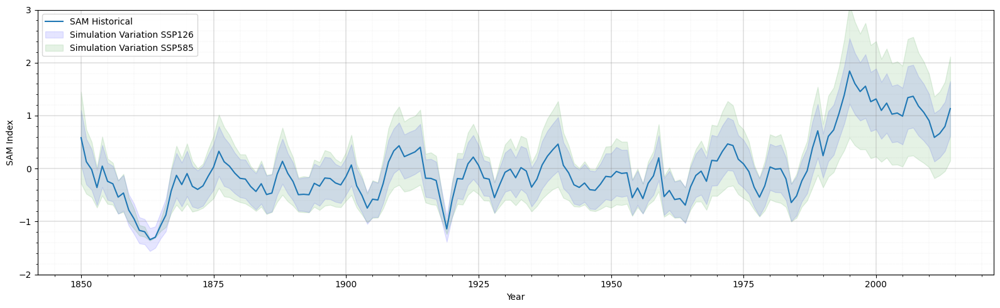

In [496]:
sam_sim_vari["SAM Historical (Rolling)"] = sam_sim_vari["SAM Historical"].rolling(window=5, min_periods=1).mean()

# rolling averages
sam_sim_vari["Simulation Variation SSP126 (Rolling)"] = sam_sim_vari["Simulation Variation SSP126"].rolling(window=5, min_periods=1).mean()
sam_sim_vari["Simulation Variation SSP585 (Rolling)"] = sam_sim_vari["Simulation Variation SSP585"].rolling(window=5, min_periods=1).mean()

historical_start = 1850
historical_end = 2014

fig, ax = plt.subplots(figsize=(16, 5))

# major and minor gridlines
ax.grid(which='both', color='gray', linestyle='-', linewidth=0.3)
ax.minorticks_on()
ax.grid(which='minor', color='gray', linestyle=':', linewidth=0.1)  # Minor gridlines

# SAM Historical
ax.plot(sam_sim_vari.loc[historical_start:historical_end].index, 
        sam_sim_vari.loc[historical_start:historical_end, "SAM Historical (Rolling)"], 
        label="SAM Historical")

# Fill between SAM Historical (rolling average) and SSP126 Variation
ax.fill_between(sam_sim_vari.loc[historical_start:historical_end].index, 
                sam_sim_vari.loc[historical_start:historical_end, "SAM Historical (Rolling)"] - sam_sim_vari.loc[historical_start:historical_end, "Simulation Variation SSP126 (Rolling)"], 
                sam_sim_vari.loc[historical_start:historical_end, "SAM Historical (Rolling)"] + sam_sim_vari.loc[historical_start:historical_end, "Simulation Variation SSP126 (Rolling)"], 
                color='blue', alpha=0.1, label="Simulation Variation SSP126")

# Fill between SAM Historical (rolling average) and SSP585 Variation
ax.fill_between(sam_sim_vari.loc[historical_start:historical_end].index, 
                sam_sim_vari.loc[historical_start:historical_end, "SAM Historical (Rolling)"] - sam_sim_vari.loc[historical_start:historical_end, "Simulation Variation SSP585 (Rolling)"], 
                sam_sim_vari.loc[historical_start:historical_end, "SAM Historical (Rolling)"] + sam_sim_vari.loc[historical_start:historical_end, "Simulation Variation SSP585 (Rolling)"], 
                color='green', alpha=0.1, label="Simulation Variation SSP585")

ax.set_title("")
ax.legend(loc='upper left')
ax.set_ylim(-2, 3.0)
ax.set_yticks([-2, -1, 0, 1, 2, 3])
ax.set_ylabel("SAM Index")
plt.xlabel("Year")

# Adjust layout
plt.tight_layout()
plt.show()

# Figure 2: Establishing Link between SAM and SST w/ Impact Across SSP Scenarios

## Figure 2a: SST and SAM (with regression correlation) Across All Scenarios - Historical Timeseries

In [498]:
# hist
sst_reg1 = 'sam_sst_regression_ann'
samsst_hist = hist[sst_reg1]
samsst_hist

<xarray.DataArray 'sam_sst_regression_ann' (lat: 144, lon: 192)> Size: 111kB
array([[      nan,       nan,       nan, ...,       nan,       nan,       nan],
       [      nan,       nan,       nan, ...,       nan,       nan,       nan],
       [      nan,       nan,       nan, ...,       nan,       nan,       nan],
       ...,
       [ 0.000785,  0.000622,  0.00026 , ...,  0.001339,  0.001399,  0.000945],
       [-0.002833, -0.003048, -0.00322 , ..., -0.002361, -0.00246 , -0.002471],
       [-0.00193 , -0.001868, -0.001804, ..., -0.00196 , -0.001922, -0.001864]],
      dtype=float32)
Coordinates:
  * lat      (lat) float64 1kB -89.38 -88.12 -86.88 -85.62 ... 86.88 88.12 89.38
  * lon      (lon) float64 2kB 0.9375 2.812 4.688 6.562 ... 355.3 357.2 359.1
Attributes:
    standard_name:  surface_temperature
    long_name:      sst regression onto SAM principal component timeseries (a...
    comment:        mo: "skin" temperature (i.e., SST for open ocean)., CMIP_...
    units:          C
    original_name:  mo: (stash: m01s00i024, lbproc: 128)
    history:        2019-04-05T16:02:58Z altered by CMOR: replaced missing va...

In [499]:
# ssp126
sst_reg2 = 'sam_sst_regression_ann'
samsst_ssp126 = ssp126hist[sst_reg2]
samsst_ssp126

<xarray.DataArray 'sam_sst_regression_ann' (lat: 144, lon: 192)> Size: 111kB
array([[     nan,      nan,      nan, ...,      nan,      nan,      nan],
       [     nan,      nan,      nan, ...,      nan,      nan,      nan],
       [     nan,      nan,      nan, ...,      nan,      nan,      nan],
       ...,
       [0.091844, 0.092772, 0.093913, ..., 0.08919 , 0.089778, 0.091098],
       [0.081881, 0.082051, 0.08247 , ..., 0.080299, 0.08107 , 0.081704],
       [0.07158 , 0.071645, 0.071593, ..., 0.071609, 0.071616, 0.071625]],
      dtype=float32)
Coordinates:
  * lat      (lat) float64 1kB -89.38 -88.12 -86.88 -85.62 ... 86.88 88.12 89.38
  * lon      (lon) float64 2kB 0.9375 2.812 4.688 6.562 ... 355.3 357.2 359.1
Attributes:
    standard_name:  surface_temperature
    long_name:      sst regression onto SAM principal component timeseries (a...
    comment:        mo: "skin" temperature (i.e., SST for open ocean)., CMIP_...
    units:          C
    original_name:  mo: (stash: m01s00i024, lbproc: 128)
    history:        2019-04-05T16:02:58Z altered by CMOR: replaced missing va...

In [500]:
# ssp585
sst_reg3 = 'sam_sst_regression_ann'
samsst_ssp585 = ssp585hist[sst_reg3]
samsst_ssp585

<xarray.DataArray 'sam_sst_regression_ann' (lat: 144, lon: 192)> Size: 111kB
array([[     nan,      nan,      nan, ...,      nan,      nan,      nan],
       [     nan,      nan,      nan, ...,      nan,      nan,      nan],
       [     nan,      nan,      nan, ...,      nan,      nan,      nan],
       ...,
       [1.141685, 1.152964, 1.167123, ..., 1.105565, 1.112115, 1.128387],
       [1.160322, 1.165378, 1.171543, ..., 1.133805, 1.145377, 1.153995],
       [1.154481, 1.154492, 1.154508, ..., 1.154485, 1.15453 , 1.154514]],
      dtype=float32)
Coordinates:
  * lat      (lat) float64 1kB -89.38 -88.12 -86.88 -85.62 ... 86.88 88.12 89.38
  * lon      (lon) float64 2kB 0.9375 2.812 4.688 6.562 ... 355.3 357.2 359.1
Attributes:
    standard_name:  surface_temperature
    long_name:      sst regression onto SAM principal component timeseries (a...
    comment:        mo: "skin" temperature (i.e., SST for open ocean)., CMIP_...
    units:          C
    original_name:  mo: (stash: m01s00i024, lbproc: 128)
    history:        2019-04-05T16:02:58Z altered by CMOR: replaced missing va...

In [502]:
# lat lon for plotting
lat= hist['lat']
lon= hist['lon']

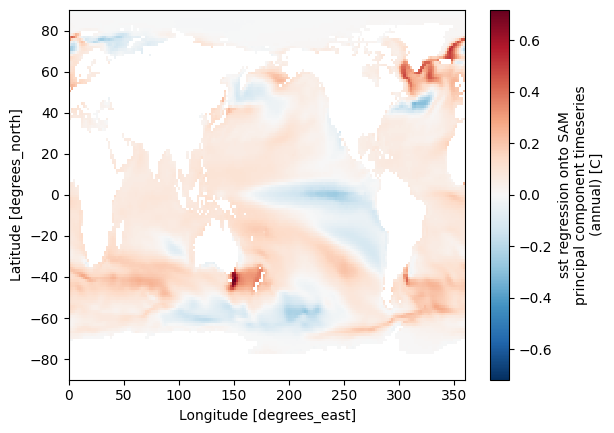

In [503]:
samsst_hist.plot()

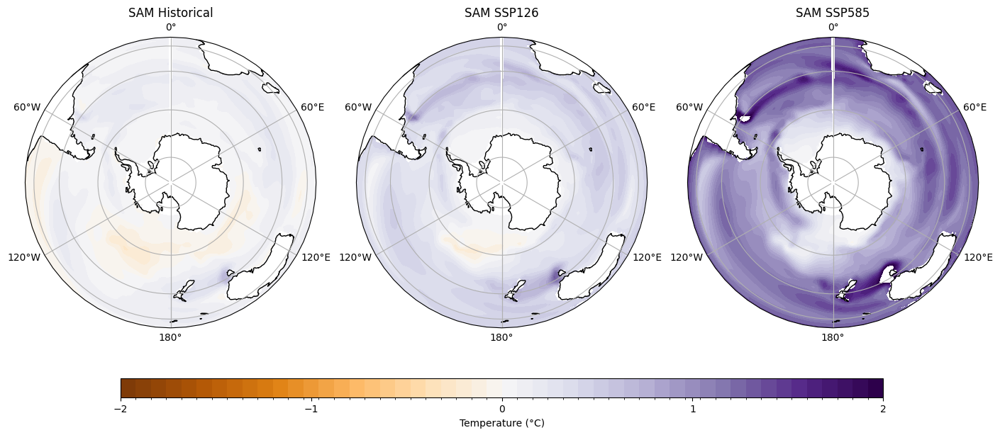

In [504]:
cmap = plt.get_cmap('PuOr')
cmap_limits = [-2, 2]
levels = np.linspace(cmap_limits[0], cmap_limits[1], 51)
norm = mcolors.BoundaryNorm(boundaries=levels, ncolors=256)

projection = ccrs.Orthographic(central_latitude=-90, central_longitude=0)
transform = ccrs.PlateCarree()

scenario = ['Historical', 'SSP126', 'SSP585']
datasets = [samsst_hist, samsst_ssp126, samsst_ssp585]

# subplots
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(14, 10), subplot_kw={'projection': projection}, constrained_layout=True)

tick_values = np.linspace(cmap_limits[0], cmap_limits[1], 5)

for data, ax, scenario in zip(datasets, axs.flat, scenario):
    
    samsst_hist = data
    # contours for sst
    im = ax.contourf(lon, lat, samsst_hist, levels=levels, transform=transform, cmap=cmap, norm=norm)
    # plot features
    ax.set_title(f'SAM {scenario}')
    ax.coastlines()
    gl = ax.gridlines(draw_labels=True)

cbar = fig.colorbar(im, ax=axs, orientation='horizontal', pad=0.05, shrink=0.8, aspect= 40, ticks=tick_values)
cbar.set_label('Temperature (°C)')

plt.show()

## Figure 2b: Plotting SST Across All Scenarios

In [505]:
# hist
sic_var1 = 'sic_sh_spatialmean_ann'
sic_sh_hist1 = hist[sic_var1]
sic_sh_hist1

<xarray.DataArray 'sic_sh_spatialmean_ann' (j: 330, i: 360)> Size: 475kB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * i          (i) int32 1kB 0 1 2 3 4 5 6 7 ... 352 353 354 355 356 357 358 359
  * j          (j) int32 1kB 0 1 2 3 4 5 6 7 ... 322 323 324 325 326 327 328 329
    latitude   (j, i) float32 475kB ...
    longitude  (j, i) float32 475kB ...
Attributes:
    history:         2019-04-05T15:48:59Z altered by CMOR: Converted units fr...
    original_units:  1
    original_name:   mo: (variable_name: aice)
    units:           %
    comment:         Area fraction of grid cell covered by sea ice
    long_name:       Southern Hemisphere sic mean (annual)
    standard_name:   sea_ice_area_fraction

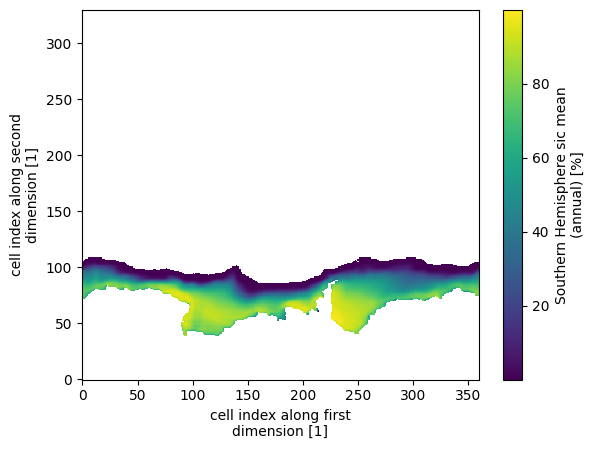

In [506]:
sic_sh_hist = sic_sh_hist1.where(sic_sh_hist1>0)
sic_sh_hist.plot()

In [508]:
# ssp126
sic_var2 = 'sic_sh_spatialmean_ann'
sic_sh_ssp1261 = ssp126mean[sic_var2]
sic_sh_ssp1261

<xarray.DataArray 'sic_sh_spatialmean_ann' (j: 330, i: 360)> Size: 475kB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * i          (i) int32 1kB 0 1 2 3 4 5 6 7 ... 352 353 354 355 356 357 358 359
  * j          (j) int32 1kB 0 1 2 3 4 5 6 7 ... 322 323 324 325 326 327 328 329
    latitude   (j, i) float32 475kB ...
    longitude  (j, i) float32 475kB ...
Attributes:
    history:         2019-04-05T15:48:59Z altered by CMOR: Converted units fr...
    original_units:  1
    original_name:   mo: (variable_name: aice)
    units:           %
    comment:         Area fraction of grid cell covered by sea ice
    long_name:       Southern Hemisphere sic mean (annual)
    standard_name:   sea_ice_area_fraction

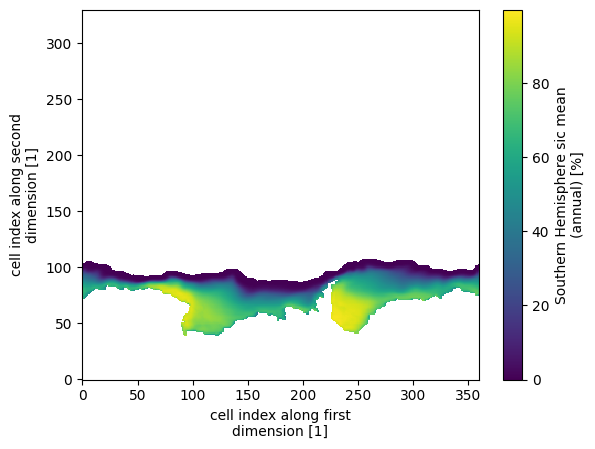

In [509]:
sic_sh_ssp126 = sic_sh_ssp1261.where(sic_sh_ssp1261>0)
sic_sh_ssp126.plot()

In [510]:
# ssp585
sic_var3 = 'sic_sh_spatialmean_ann'
sic_sh_ssp5851 = ssp585mean[sic_var3]
sic_sh_ssp5851

<xarray.DataArray 'sic_sh_spatialmean_ann' (j: 330, i: 360)> Size: 475kB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * i          (i) int32 1kB 0 1 2 3 4 5 6 7 ... 352 353 354 355 356 357 358 359
  * j          (j) int32 1kB 0 1 2 3 4 5 6 7 ... 322 323 324 325 326 327 328 329
    latitude   (j, i) float32 475kB ...
    longitude  (j, i) float32 475kB ...
Attributes:
    history:         2019-04-05T15:48:59Z altered by CMOR: Converted units fr...
    original_units:  1
    original_name:   mo: (variable_name: aice)
    units:           %
    comment:         Area fraction of grid cell covered by sea ice
    long_name:       Southern Hemisphere sic mean (annual)
    standard_name:   sea_ice_area_fraction

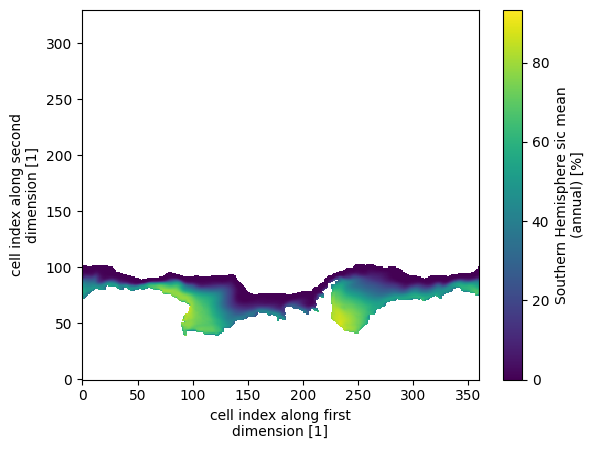

In [511]:
sic_sh_ssp585 = sic_sh_ssp5851.where(sic_sh_ssp5851>0)
sic_sh_ssp585.plot()

In [512]:
# lat lon for ice grid
lon2d=hist['lon2d_ice_sh']
lat2d=hist['lat2d_ice_sh']

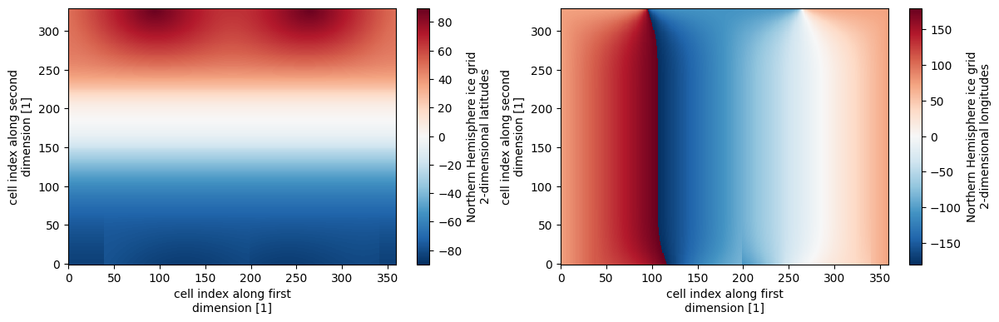

In [513]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14,4))
lat2d.plot(ax=ax1)
lon2d.plot(ax=ax2)

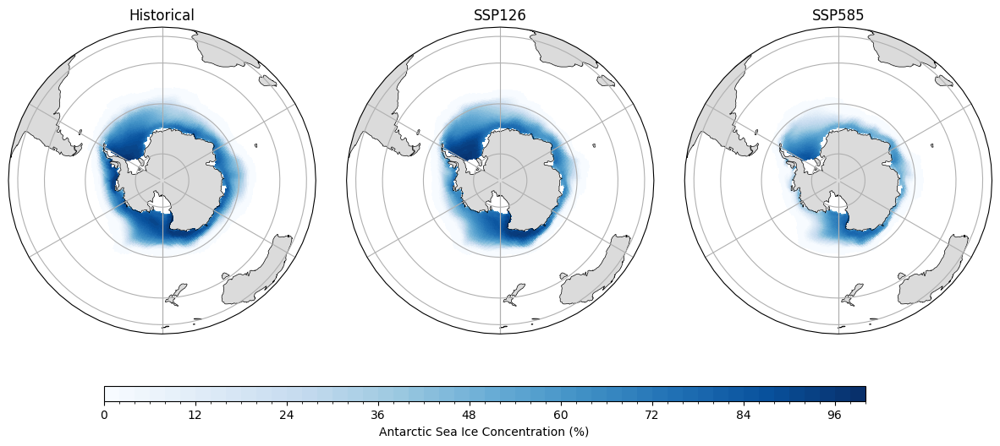

In [515]:
variables = [sic_sh_hist, sic_sh_ssp126, sic_sh_ssp585]
scenarios = ['Historical', 'SSP126', 'SSP585']

cmap = plt.get_cmap('Blues')
projection = ccrs.Orthographic(central_latitude=-90, central_longitude=0)
transform = ccrs.PlateCarree()

bounds = np.linspace(0, 100, 51)
norm = mcolors.BoundaryNorm(boundaries=bounds, ncolors=256)

# subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 6), subplot_kw={'projection': projection}, 
                        gridspec_kw={'wspace': 0.1})

for ax, var, scenario in zip(axs, variables, scenarios):
    ax.add_feature(cfeature.LAND, zorder=1, facecolor=cfeature.COLORS['land_alt1'])
    ax.coastlines(resolution='110m', linewidth=0.5)
    ax.gridlines()

    pcm = ax.pcolormesh(lon2d, lat2d, var, transform=transform, cmap=cmap, norm=norm)

    ax.set_title(scenario)

cbar_height = 0.03
cbar_width = 0.6  
cbar_ax = fig.add_axes([0.2, 0.06, cbar_width, cbar_height])  
cbar = plt.colorbar(pcm, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Antarctic Sea Ice Concentration (%)')

plt.show()

In [516]:
sst_vars = [var for var in hist.variables if 'tas' in var]
sst_vars

['amm_tas_regression_mon',
 'amo_tas_regression_lowpass_mon',
 'amo_tas_regression_mon',
 'atl3_tas_regression_mon',
 'iod_tas_regression_mon',
 'ipcc_ALA_tas',
 'ipcc_AMZ_tas',
 'ipcc_ANT_lnd_tas',
 'ipcc_ANT_ocn_tas',
 'ipcc_ARC_lnd_tas',
 'ipcc_ARC_ocn_tas',
 'ipcc_CAM_tas',
 'ipcc_CAR_tas',
 'ipcc_CAS_tas',
 'ipcc_CEU_tas',
 'ipcc_CGI_tas',
 'ipcc_CNA_tas',
 'ipcc_EAF_tas',
 'ipcc_EAS_tas',
 'ipcc_ENA_tas',
 'ipcc_ETP_tas',
 'ipcc_GLOBAL_all_tas',
 'ipcc_GLOBAL_lnd_tas',
 'ipcc_GLOBAL_ocn_tas',
 'ipcc_MED_tas',
 'ipcc_NAS_tas',
 'ipcc_NAU_tas',
 'ipcc_NEB_tas',
 'ipcc_NEU_tas',
 'ipcc_NTP_tas',
 'ipcc_SAF_tas',
 'ipcc_SAH_tas',
 'ipcc_SAS_lnd_tas',
 'ipcc_SAS_ocn_tas',
 'ipcc_SAU_tas',
 'ipcc_SEA_lnd_tas',
 'ipcc_SEA_ocn_tas',
 'ipcc_SSA_tas',
 'ipcc_STP_tas',
 'ipcc_TIB_tas',
 'ipcc_WAF_tas',
 'ipcc_WAS_tas',
 'ipcc_WIO_tas',
 'ipcc_WNA_tas',
 'ipcc_WSA_tas',
 'ipo_tas_regression_mon',
 'nam_tas_regression_ann',
 'nam_tas_regression_djf',
 'nam_tas_regression_jja',
 'nam_tas_regre

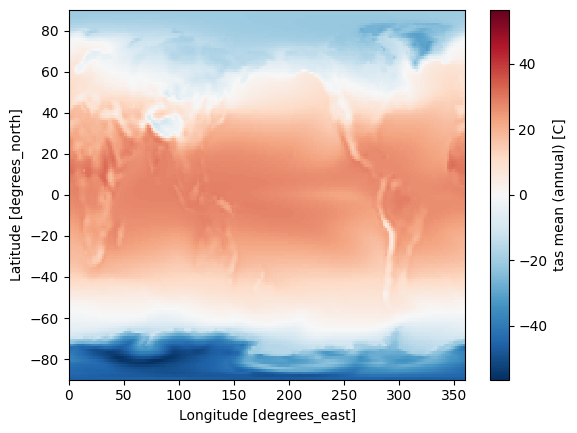

In [517]:
# hist
tas_var1 = 'tas_spatialmean_ann'
tas_hist_spat = hist[tas_var1]
tas_hist_spat.plot()

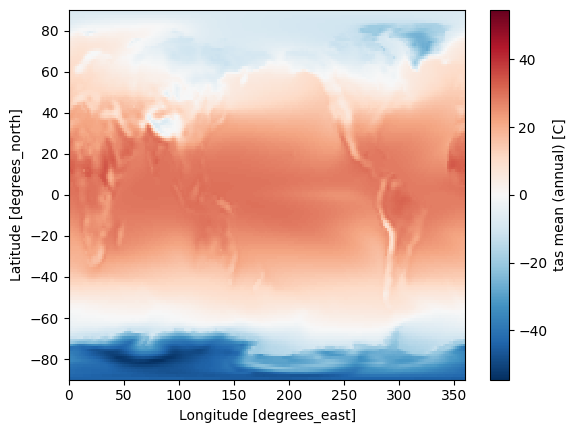

In [518]:
# ssp126
tas_var2 = 'tas_spatialmean_ann'
tas_126_spat = ssp126mean[tas_var2]
tas_126_spat.plot()

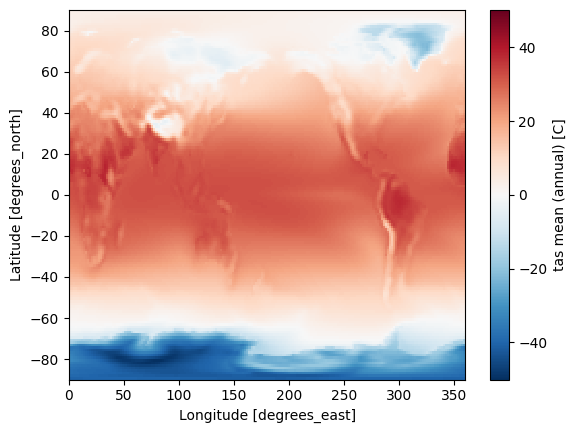

In [519]:
# ssp585
tas_var3 = 'tas_spatialmean_ann'
tas_585_spat = ssp585mean[tas_var3]
tas_585_spat.plot()

sst_var2 = 'sst_spatialmean_ann'
sst_hist_spat = hist[sst_var2]
sst_hist_spat

sst_var3 = 'sst_spatialmean_ann'
sst_126_spat = ssp126mean[sst_var3]
sst_126_spat.plot()

sst_var4 = 'sst_spatialmean_ann'
sst_585_spat = ssp585mean[sst_var4]
sst_585_spat.plot()

In [520]:
lon = hist['longitude']
lat = hist['latitude']

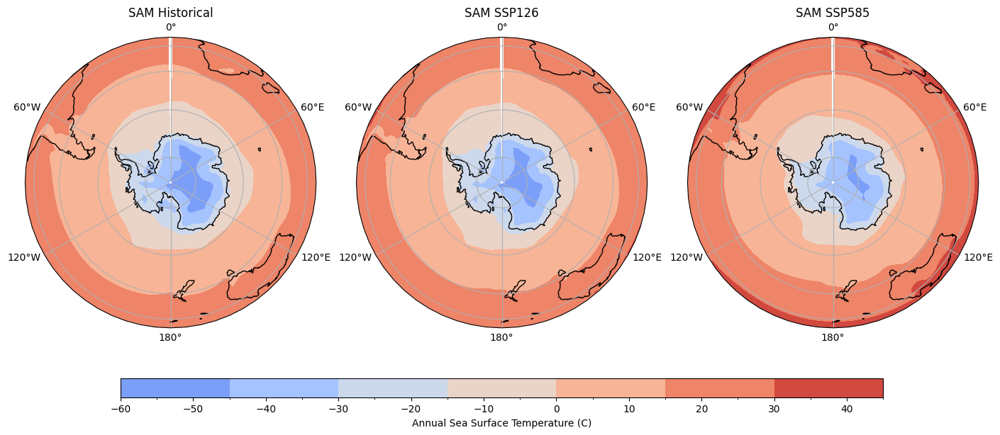

In [521]:
cmap = plt.get_cmap('coolwarm')
cmap_limits = [-80, 50]
levels = mcolors.BoundaryNorm(boundaries=range(-80, 51, 5), ncolors=256)

projection = ccrs.Orthographic(central_latitude=-90, central_longitude=0)
transform = ccrs.PlateCarree()

seasons = ['Historical', 'SSP126', 'SSP585']
datasets = [tas_hist_spat, tas_126_spat, tas_585_spat]

# subplots
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(14, 10), subplot_kw={'projection': projection}, constrained_layout=True)

for data, ax, season in zip(datasets, axs.flat, seasons):
    lat = hist['lat']
    lon = hist['lon']
    
    tas_hist_spat = data
    # contours
    im = ax.contourf(lon, lat, tas_hist_spat, transform=transform, cmap=cmap, norm=levels)
    
    ax.set_title(f'SAM {season}')
    ax.coastlines()
    gl = ax.gridlines(draw_labels=True)
    
cbar = fig.colorbar(im, ax=axs, orientation='horizontal', pad=0.05, shrink=0.8, aspect=40)
cbar.set_label('Annual Sea Surface Temperature (C)')
cbar.set_ticks(range(-60, 50, 10)) 

plt.show()

## Figure 2c: Plotting TAS and SIC Across All Scenarios

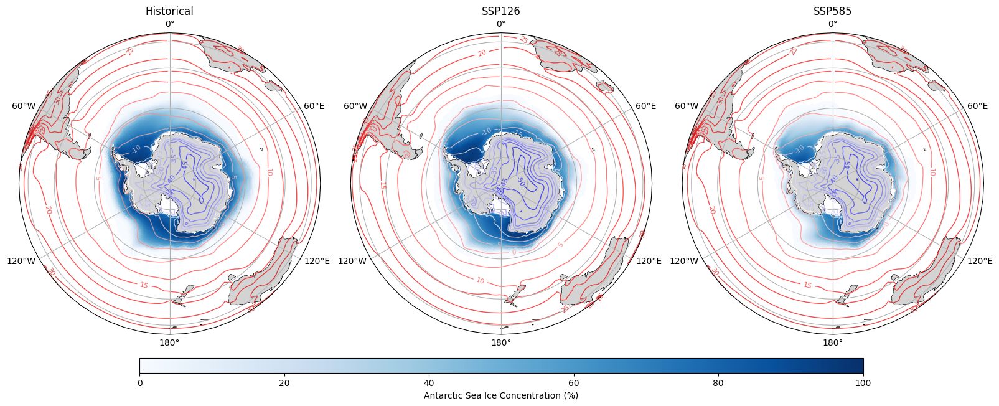

In [522]:
sic_variables = [sic_sh_hist, sic_sh_ssp126, sic_sh_ssp585]
tas_variables = [tas_hist_spat, tas_126_spat, tas_585_spat]
scenarios = ['Historical', 'SSP126', 'SSP585']

fig, axs = plt.subplots(1, 3, figsize=(20, 10), subplot_kw={'projection': ccrs.Orthographic(central_latitude=-90, central_longitude=0)}, gridspec_kw={'wspace': 0.1})

# sic and tas
for ax, sic_var, tas_var, scenario in zip(axs, sic_variables, tas_variables, scenarios):
    
    cmap_sic = plt.get_cmap('Blues')
    bounds_sic = [0, 25, 50, 75, 100]
    cmap_tas = plt.get_cmap('seismic')
    pcm_sic = ax.pcolormesh(lon2d, lat2d, sic_var, transform=ccrs.PlateCarree(), cmap=cmap_sic, vmax=100)

    # tas contours
    cf = ax.contour(lon, lat, tas_var, levels=range(-80, 51, 5), cmap=cmap_tas, linewidths=1, transform=ccrs.PlateCarree(), alpha=0.7)
    # tas contours labels
    ax.clabel(cf, fmt='%d', inline=True, fontsize=8)

    ax.set_title(scenario)

    ax.add_feature(cfeature.LAND, zorder=1, facecolor='lightgray')
    ax.coastlines(resolution='110m', linewidth=0.5)
    ax.gridlines(draw_labels=True)

cbar_sic = fig.colorbar(pcm_sic, ax=axs, orientation='horizontal', pad=0.05, shrink=0.75, aspect=50)
cbar_sic.set_label('Antarctic Sea Ice Concentration (%)')

plt.show()

## Figure 3a: Plotting Mean SAM and SIC Across All Scenarios

In [523]:
sam_vars = [var for var in hist.variables if 'sam' in var]
sam_vars

['sam_ann',
 'sam_djf',
 'sam_jja',
 'sam_mam',
 'sam_mon',
 'sam_pr_regression_ann',
 'sam_pr_regression_djf',
 'sam_pr_regression_jja',
 'sam_pr_regression_mam',
 'sam_pr_regression_mon',
 'sam_pr_regression_son',
 'sam_son',
 'sam_sst_regression_ann',
 'sam_sst_regression_djf',
 'sam_sst_regression_jja',
 'sam_sst_regression_mam',
 'sam_sst_regression_mon',
 'sam_sst_regression_son',
 'sam_tas_regression_ann',
 'sam_tas_regression_djf',
 'sam_tas_regression_jja',
 'sam_tas_regression_mam',
 'sam_tas_regression_mon',
 'sam_tas_regression_son',
 'sam_timeseries_ann',
 'sam_timeseries_djf',
 'sam_timeseries_jja',
 'sam_timeseries_mam',
 'sam_timeseries_mon',
 'sam_timeseries_son']

In [525]:
# hist
sam_var1 = 'sam_ann'
sam_hist_ann1 = hist[sam_var1]
sam_hist_ann1

<xarray.DataArray 'sam_ann' (lat: 144, lon: 192)> Size: 111kB
array([[-1.821782, -1.821946, -1.822181, ..., -1.821511, -1.821566, -1.821668],
       [-1.727829, -1.72831 , -1.728904, ..., -1.727126, -1.727244, -1.727481],
       [-1.728293, -1.729281, -1.730498, ..., -1.726113, -1.726614, -1.727413],
       ...,
       [ 0.083188,  0.083494,  0.083759, ...,  0.081941,  0.082376,  0.082816],
       [ 0.081144,  0.08102 ,  0.080884, ...,  0.081396,  0.081328,  0.081247],
       [ 0.080582,  0.080465,  0.080356, ...,  0.080886,  0.080794,  0.08068 ]],
      dtype=float32)
Coordinates:
  * lat      (lat) float64 1kB -89.38 -88.12 -86.88 -85.62 ... 86.88 88.12 89.38
  * lon      (lon) float64 2kB 0.9375 2.812 4.688 6.562 ... 355.3 357.2 359.1
Attributes:
    standard_name:  air_pressure_at_mean_sea_level
    long_name:      SAM spatial pattern (annual)
    comment:        Sea Level Pressure
    units:          hPa
    original_name:  mo: (stash: m01s16i222, lbproc: 128)
    history:        2019-04-05T16:01:24Z altered by CMOR: replaced missing va...
    pcvar:          43%*

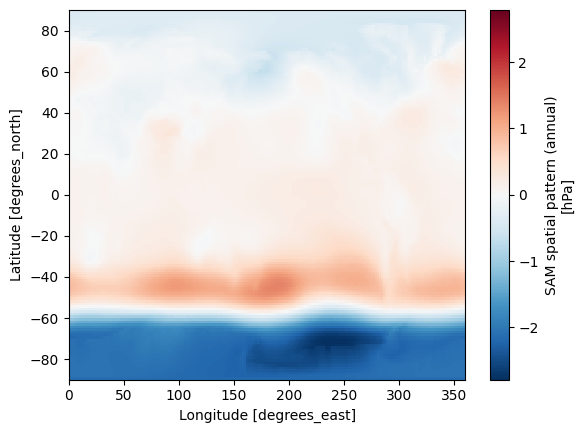

In [526]:
# ssp126
sam_var2 = 'sam_ann'
sam_ssp126_ann1 = ssp126mean[sam_var2]
sam_ssp126_ann1.plot()

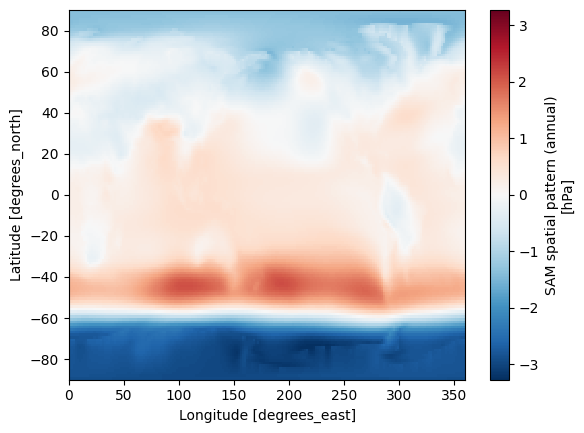

In [527]:
# ssp585
sam_var3 = 'sam_ann'
sam_ssp585_ann1 = ssp585mean[sam_var3]
sam_ssp585_ann1.plot()

In [528]:
# SIC Variables: sic_sh_hist, sic_sh_ssp126, sic_sh_ssp585

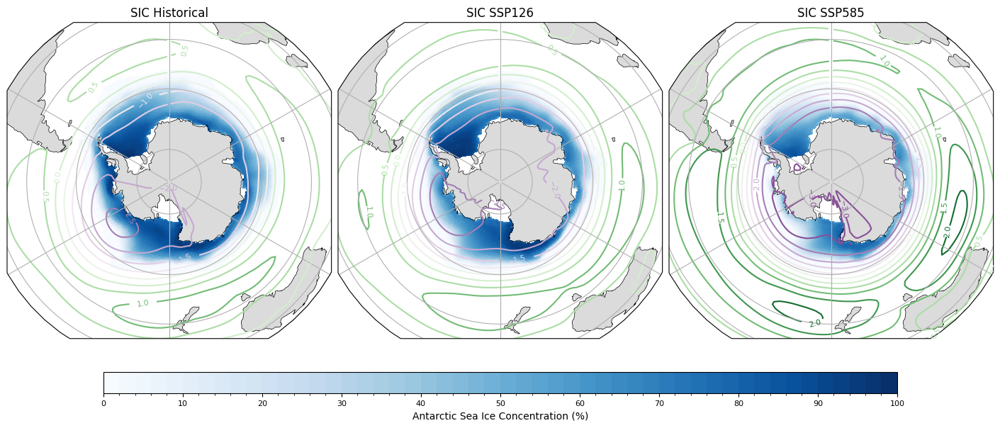

In [547]:
sic_data = [sic_sh_hist, sic_sh_ssp126, sic_sh_ssp585]
sic_seasons = ['Historical', 'SSP126', 'SSP585']
sam_data = [sam_hist_ann1, sam_ssp126_ann1, sam_ssp585_ann1]
sam_seasons = ['Historical', 'SSP126', 'SSP585']

cmap_sic = plt.get_cmap('Blues')
cmap_sam = plt.get_cmap('PRGn')
cmap_limits_sam = [-5, 5]
bounds_sic = np.linspace(0, 100, 51)

# contour levels for SAM 0.5 hpa
min_sam = np.floor(np.min([np.min(arr) for arr in sam_data]))
max_sam = np.ceil(np.max([np.max(arr) for arr in sam_data]))
levels_sam = np.arange(min_sam, max_sam + 0.5, 0.5)

norm_sic = mcolors.BoundaryNorm(boundaries=bounds_sic, ncolors=256)
norm_sam = mcolors.BoundaryNorm(boundaries=levels_sam, ncolors=256)
projection = ccrs.Orthographic(central_latitude=-90, central_longitude=0)
transform = ccrs.PlateCarree()

# subplots
fig, axs = plt.subplots(1, 3, figsize=(14, 10), subplot_kw={'projection': projection}, constrained_layout=True)

for col in range(3):
    # SIC
    ax = axs[col]
    ax.add_feature(cfeature.LAND, zorder=1, facecolor=cfeature.COLORS['land_alt1'])
    ax.coastlines(resolution='110m', linewidth=0.5)
    ax.gridlines()
    
    pcm_sic = ax.pcolormesh(lon2d, lat2d, sic_data[col], transform=transform, cmap=cmap_sic, norm=norm_sic)
    ax.set_title(f'SIC {sic_seasons[col]}')
    # setting specific region
    ax.set_extent([lon.min() + 60, lon.max() - 30, lat.min() + 60, lat.max() - 35], crs=ccrs.PlateCarree())

    # SAM contours with labels
    cs_sam = ax.contour(lon, lat, sam_data[col], levels=levels_sam, transform=transform,
                        cmap=cmap_sam, norm=norm_sam, alpha=1)
    ax.clabel(cs_sam, inline=True, fontsize=8)

cb_height = 0.03
cb_pad = 1 

cb_ax_sic = fig.add_axes([0.1, 0.2, 0.8, cb_height])
cbar_sic = plt.colorbar(pcm_sic, cax=cb_ax_sic, orientation='horizontal', ticks=np.arange(0, 101, 10))
cbar_sic.ax.tick_params(labelsize=8) 
cbar_sic.set_label('Antarctic Sea Ice Concentration (%)')

plt.show()

## Figure 3b: Plotting Mean SAM and SIC Across All Seasonal Scenarios 

### Seasonal SIC for All Scenarios:

In [548]:
# hist winter
sic_var4 = 'sic_sh_spatialmean_jja'
sic_sh_jja1 = hist[sic_var4]
sic_hist_winter = sic_sh_jja1.where(sic_sh_jja1>0)
sic_hist_winter

<xarray.DataArray 'sic_sh_spatialmean_jja' (j: 330, i: 360)> Size: 475kB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * i          (i) int32 1kB 0 1 2 3 4 5 6 7 ... 352 353 354 355 356 357 358 359
  * j          (j) int32 1kB 0 1 2 3 4 5 6 7 ... 322 323 324 325 326 327 328 329
    latitude   (j, i) float32 475kB -84.11 -84.11 -84.11 ... 50.51 50.23 50.01
    longitude  (j, i) float32 475kB 73.5 74.5 75.5 76.5 ... 72.95 72.96 72.99
Attributes:
    history:         2019-04-05T15:48:59Z altered by CMOR: Converted units fr...
    original_units:  1
    original_name:   mo: (variable_name: aice)
    units:           %
    comment:         Area fraction of grid cell covered by sea ice
    long_name:       Southern Hemisphere sic mean (JJA)
    standard_name:   sea_ice_area_fraction

In [549]:
# hist summer
sic_var5 = 'sic_sh_spatialmean_djf'
sic_sh_djf1 = hist[sic_var5]
sic_hist_summer = sic_sh_djf1.where(sic_sh_djf1>0)
sic_hist_summer

<xarray.DataArray 'sic_sh_spatialmean_djf' (j: 330, i: 360)> Size: 475kB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * i          (i) int32 1kB 0 1 2 3 4 5 6 7 ... 352 353 354 355 356 357 358 359
  * j          (j) int32 1kB 0 1 2 3 4 5 6 7 ... 322 323 324 325 326 327 328 329
    latitude   (j, i) float32 475kB -84.11 -84.11 -84.11 ... 50.51 50.23 50.01
    longitude  (j, i) float32 475kB 73.5 74.5 75.5 76.5 ... 72.95 72.96 72.99
Attributes:
    standard_name:   sea_ice_area_fraction
    long_name:       Southern Hemisphere sic mean (DJF)
    comment:         Area fraction of grid cell covered by sea ice
    units:           %
    original_name:   mo: (variable_name: aice)
    original_units:  1
    history:         2019-04-05T15:48:59Z altered by CMOR: Converted units fr...

In [550]:
# ssp126 winter
sic_var6 = 'sic_sh_spatialmean_jja'
sic_sh_jja2 = ssp126mean[sic_var6]
sic_ssp126_winter = sic_sh_jja2.where(sic_sh_jja2>0)
sic_ssp126_winter

<xarray.DataArray 'sic_sh_spatialmean_jja' (j: 330, i: 360)> Size: 475kB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * i          (i) int32 1kB 0 1 2 3 4 5 6 7 ... 352 353 354 355 356 357 358 359
  * j          (j) int32 1kB 0 1 2 3 4 5 6 7 ... 322 323 324 325 326 327 328 329
    latitude   (j, i) float32 475kB -84.11 -84.11 -84.11 ... 50.51 50.23 50.01
    longitude  (j, i) float32 475kB 73.5 74.5 75.5 76.5 ... 72.95 72.96 72.99
Attributes:
    history:         2019-04-05T15:48:59Z altered by CMOR: Converted units fr...
    original_units:  1
    original_name:   mo: (variable_name: aice)
    units:           %
    comment:         Area fraction of grid cell covered by sea ice
    long_name:       Southern Hemisphere sic mean (JJA)
    standard_name:   sea_ice_area_fraction

In [551]:
# ssp126 summer
sic_var7 = 'sic_sh_spatialmean_djf'
sic_sh_djf2 = ssp126mean[sic_var7]
sic_ssp126_summer = sic_sh_djf2.where(sic_sh_djf2>0)
sic_ssp126_summer

<xarray.DataArray 'sic_sh_spatialmean_djf' (j: 330, i: 360)> Size: 475kB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * i          (i) int32 1kB 0 1 2 3 4 5 6 7 ... 352 353 354 355 356 357 358 359
  * j          (j) int32 1kB 0 1 2 3 4 5 6 7 ... 322 323 324 325 326 327 328 329
    latitude   (j, i) float32 475kB -84.11 -84.11 -84.11 ... 50.51 50.23 50.01
    longitude  (j, i) float32 475kB 73.5 74.5 75.5 76.5 ... 72.95 72.96 72.99
Attributes:
    standard_name:   sea_ice_area_fraction
    long_name:       Southern Hemisphere sic mean (DJF)
    comment:         Area fraction of grid cell covered by sea ice
    units:           %
    original_name:   mo: (variable_name: aice)
    original_units:  1
    history:         2019-04-05T15:48:59Z altered by CMOR: Converted units fr...

In [552]:
# ssp585 winter
sic_var8 = 'sic_sh_spatialmean_jja'
sic_sh_jja3 = ssp585mean[sic_var8]
sic_ssp585_winter = sic_sh_jja3.where(sic_sh_jja3>0)
sic_ssp585_winter

<xarray.DataArray 'sic_sh_spatialmean_jja' (j: 330, i: 360)> Size: 475kB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * i          (i) int32 1kB 0 1 2 3 4 5 6 7 ... 352 353 354 355 356 357 358 359
  * j          (j) int32 1kB 0 1 2 3 4 5 6 7 ... 322 323 324 325 326 327 328 329
    latitude   (j, i) float32 475kB -84.11 -84.11 -84.11 ... 50.51 50.23 50.01
    longitude  (j, i) float32 475kB 73.5 74.5 75.5 76.5 ... 72.95 72.96 72.99
Attributes:
    history:         2019-04-05T15:48:59Z altered by CMOR: Converted units fr...
    original_units:  1
    original_name:   mo: (variable_name: aice)
    units:           %
    comment:         Area fraction of grid cell covered by sea ice
    long_name:       Southern Hemisphere sic mean (JJA)
    standard_name:   sea_ice_area_fraction

In [553]:
# ssp585 summer
sic_var9 = 'sic_sh_spatialmean_djf'
sic_sh_djf3 = ssp585mean[sic_var9]
sic_ssp585_summer = sic_sh_djf3.where(sic_sh_djf3>0)
sic_ssp585_summer

<xarray.DataArray 'sic_sh_spatialmean_djf' (j: 330, i: 360)> Size: 475kB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * i          (i) int32 1kB 0 1 2 3 4 5 6 7 ... 352 353 354 355 356 357 358 359
  * j          (j) int32 1kB 0 1 2 3 4 5 6 7 ... 322 323 324 325 326 327 328 329
    latitude   (j, i) float32 475kB -84.11 -84.11 -84.11 ... 50.51 50.23 50.01
    longitude  (j, i) float32 475kB 73.5 74.5 75.5 76.5 ... 72.95 72.96 72.99
Attributes:
    standard_name:   sea_ice_area_fraction
    long_name:       Southern Hemisphere sic mean (DJF)
    comment:         Area fraction of grid cell covered by sea ice
    units:           %
    original_name:   mo: (variable_name: aice)
    original_units:  1
    history:         2019-04-05T15:48:59Z altered by CMOR: Converted units fr...

### Seasonal SAM for All Scenarios:
sam_djf',
 'sam_jja

In [554]:
# hist winter
sam_var4 = 'sam_jja'
sam_hist_winter = hist[sam_var4]
sam_hist_winter

<xarray.DataArray 'sam_jja' (lat: 144, lon: 192)> Size: 111kB
array([[-3.415178, -3.414992, -3.414931, ..., -3.415806, -3.415558, -3.415366],
       [-3.257612, -3.258273, -3.259131, ..., -3.256612, -3.256782, -3.257136],
       [-3.229861, -3.232215, -3.233725, ..., -3.220045, -3.22313 , -3.226619],
       ...,
       [ 0.147654,  0.146664,  0.145545, ...,  0.150613,  0.14961 ,  0.148605],
       [ 0.130498,  0.129701,  0.12888 , ...,  0.132693,  0.131977,  0.131253],
       [ 0.110289,  0.110033,  0.109769, ...,  0.110987,  0.110763,  0.110534]],
      dtype=float32)
Coordinates:
  * lat      (lat) float64 1kB -89.38 -88.12 -86.88 -85.62 ... 86.88 88.12 89.38
  * lon      (lon) float64 2kB 0.9375 2.812 4.688 6.562 ... 355.3 357.2 359.1
Attributes:
    standard_name:  air_pressure_at_mean_sea_level
    long_name:      SAM spatial pattern (JJA)
    comment:        Sea Level Pressure
    units:          hPa
    original_name:  mo: (stash: m01s16i222, lbproc: 128)
    history:        2019-04-05T16:01:24Z altered by CMOR: replaced missing va...
    pcvar:          32.6%*

In [555]:
# hist summer
sam_var5 = 'sam_djf'
sam_hist_summer = hist[sam_var5]
sam_hist_summer

<xarray.DataArray 'sam_djf' (lat: 144, lon: 192)> Size: 111kB
array([[-3.53842 , -3.538702, -3.539028, ..., -3.537915, -3.538074, -3.53824 ],
       [-3.508758, -3.508685, -3.508953, ..., -3.508942, -3.508825, -3.508781],
       [-3.516638, -3.515699, -3.515009, ..., -3.51963 , -3.518497, -3.517508],
       ...,
       [-0.080253, -0.079295, -0.078468, ..., -0.08373 , -0.082566, -0.081423],
       [-0.130716, -0.130476, -0.130335, ..., -0.131587, -0.131263, -0.130971],
       [-0.168848, -0.168884, -0.168911, ..., -0.168872, -0.168851, -0.168856]],
      dtype=float32)
Coordinates:
  * lat      (lat) float64 1kB -89.38 -88.12 -86.88 -85.62 ... 86.88 88.12 89.38
  * lon      (lon) float64 2kB 0.9375 2.812 4.688 6.562 ... 355.3 357.2 359.1
Attributes:
    standard_name:  air_pressure_at_mean_sea_level
    long_name:      SAM spatial pattern (DJF)
    comment:        Sea Level Pressure
    units:          hPa
    original_name:  mo: (stash: m01s16i222, lbproc: 128)
    history:        2019-04-05T16:01:24Z altered by CMOR: replaced missing va...
    pcvar:          55.5%*

In [556]:
# ssp126 winter
sam_var6 = 'sam_jja'
sam_ssp126_winter = ssp126mean[sam_var6]
sam_ssp126_winter

<xarray.DataArray 'sam_jja' (lat: 144, lon: 192)> Size: 111kB
array([[-3.552788, -3.552819, -3.552969, ..., -3.552874, -3.552799, -3.5528  ],
       [-3.416176, -3.416523, -3.417   , ..., -3.415834, -3.415825, -3.415949],
       [-3.393357, -3.395121, -3.396423, ..., -3.386439, -3.38861 , -3.391049],
       ...,
       [-0.054984, -0.055007, -0.055186, ..., -0.055357, -0.055188, -0.055064],
       [-0.091584, -0.091839, -0.092121, ..., -0.091155, -0.09126 , -0.091395],
       [-0.125488, -0.12557 , -0.125648, ..., -0.125376, -0.125394, -0.125437]],
      dtype=float32)
Coordinates:
  * lat      (lat) float64 1kB -89.38 -88.12 -86.88 -85.62 ... 86.88 88.12 89.38
  * lon      (lon) float64 2kB 0.9375 2.812 4.688 6.562 ... 355.3 357.2 359.1
Attributes:
    standard_name:  air_pressure_at_mean_sea_level
    long_name:      SAM spatial pattern (JJA)
    comment:        Sea Level Pressure
    units:          hPa
    original_name:  mo: (stash: m01s16i222, lbproc: 128)
    history:        2019-04-05T16:01:24Z altered by CMOR: replaced missing va...
    pcvar:          33.9%*

In [557]:
# ssp126 summer
sam_var7 = 'sam_djf'
sam_ssp126_summer = ssp126mean[sam_var7]
sam_ssp126_summer

<xarray.DataArray 'sam_djf' (lat: 144, lon: 192)> Size: 111kB
array([[-4.015789, -4.016037, -4.01645 , ..., -4.015342, -4.015437, -4.015614],
       [-3.950858, -3.951216, -3.951755, ..., -3.950208, -3.950397, -3.950591],
       [-3.950582, -3.95006 , -3.949683, ..., -3.953144, -3.952137, -3.951262],
       ...,
       [-0.399773, -0.395051, -0.390573, ..., -0.414943, -0.40979 , -0.404753],
       [-0.409169, -0.406546, -0.40401 , ..., -0.41726 , -0.414537, -0.411846],
       [-0.40903 , -0.408201, -0.40738 , ..., -0.411568, -0.410713, -0.409882]],
      dtype=float32)
Coordinates:
  * lat      (lat) float64 1kB -89.38 -88.12 -86.88 -85.62 ... 86.88 88.12 89.38
  * lon      (lon) float64 2kB 0.9375 2.812 4.688 6.562 ... 355.3 357.2 359.1
Attributes:
    standard_name:  air_pressure_at_mean_sea_level
    long_name:      SAM spatial pattern (DJF)
    comment:        Sea Level Pressure
    units:          hPa
    original_name:  mo: (stash: m01s16i222, lbproc: 128)
    history:        2019-04-05T16:01:24Z altered by CMOR: replaced missing va...
    pcvar:          60.6%*

In [558]:
# ssp585 summer
sam_var8 = 'sam_djf'
sam_ssp585_summer = ssp585mean[sam_var8]
sam_ssp585_summer

<xarray.DataArray 'sam_djf' (lat: 144, lon: 192)> Size: 111kB
array([[-4.908552, -4.909014, -4.909534, ..., -4.907196, -4.907603, -4.908078],
       [-4.86316 , -4.864555, -4.866324, ..., -4.858762, -4.86019 , -4.861598],
       [-4.844374, -4.844666, -4.844855, ..., -4.843361, -4.843345, -4.843704],
       ...,
       [-1.563278, -1.555203, -1.547373, ..., -1.588741, -1.580036, -1.571593],
       [-1.623109, -1.618779, -1.614566, ..., -1.636272, -1.631848, -1.627461],
       [-1.664816, -1.663388, -1.661981, ..., -1.669217, -1.667725, -1.666277]],
      dtype=float32)
Coordinates:
  * lat      (lat) float64 1kB -89.38 -88.12 -86.88 -85.62 ... 86.88 88.12 89.38
  * lon      (lon) float64 2kB 0.9375 2.812 4.688 6.562 ... 355.3 357.2 359.1
Attributes:
    standard_name:  air_pressure_at_mean_sea_level
    long_name:      SAM spatial pattern (DJF)
    comment:        Sea Level Pressure
    units:          hPa
    original_name:  mo: (stash: m01s16i222, lbproc: 128)
    history:        2019-04-05T16:01:24Z altered by CMOR: replaced missing va...
    pcvar:          66.4%*

In [559]:
# ssp585 winter
sam_var9 = 'sam_jja'
sam_ssp585_winter = ssp585mean[sam_var9]
sam_ssp585_winter

<xarray.DataArray 'sam_jja' (lat: 144, lon: 192)> Size: 111kB
array([[-3.846521, -3.847181, -3.847907, ..., -3.844959, -3.845466, -3.84604 ],
       [-3.743872, -3.744508, -3.745249, ..., -3.742468, -3.742828, -3.743322],
       [-3.730877, -3.733399, -3.736377, ..., -3.723638, -3.726178, -3.728533],
       ...,
       [-0.080293, -0.078671, -0.077035, ..., -0.084604, -0.083236, -0.081831],
       [-0.04628 , -0.045393, -0.044464, ..., -0.048532, -0.047858, -0.0471  ],
       [-0.006945, -0.006599, -0.006244, ..., -0.007862, -0.007579, -0.007269]],
      dtype=float32)
Coordinates:
  * lat      (lat) float64 1kB -89.38 -88.12 -86.88 -85.62 ... 86.88 88.12 89.38
  * lon      (lon) float64 2kB 0.9375 2.812 4.688 6.562 ... 355.3 357.2 359.1
Attributes:
    standard_name:  air_pressure_at_mean_sea_level
    long_name:      SAM spatial pattern (JJA)
    comment:        Sea Level Pressure
    units:          hPa
    original_name:  mo: (stash: m01s16i222, lbproc: 128)
    history:        2019-04-05T16:01:24Z altered by CMOR: replaced missing va...
    pcvar:          40%*

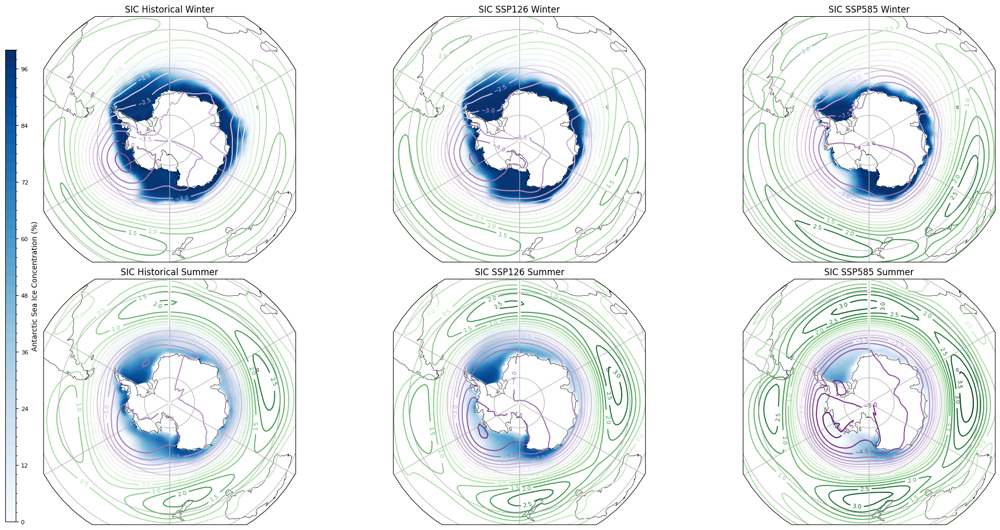

In [623]:
sic_data = [sic_hist_winter, sic_ssp126_winter, sic_ssp585_winter, sic_hist_summer, sic_ssp126_summer, sic_ssp585_summer]
sic_seasons = ['Historical Winter', 'SSP126 Winter', 'SSP585 Winter', 'Historical Summer', 'SSP126 Summer', 'SSP585 Summer']

sam_data = [sam_hist_winter, sam_ssp126_winter, sam_ssp585_winter, sam_hist_summer, sam_ssp126_summer, sam_ssp585_summer]
sam_seasons = ['Historical Winter', 'SSP126 Winter', 'SSP585 Winter', 'Historical Summer', 'SSP126 Summer', 'SSP585 Summer']

cmap_sic = plt.get_cmap('Blues')
cmap_sam = plt.get_cmap('PRGn')
bounds_sic = np.linspace(0, 100, 51)

# contours for SAM 0.5 hpa interval
min_sam = np.floor(np.min(sam_data))
max_sam = np.ceil(np.max(sam_data))
levels_sam = np.arange(min_sam, max_sam + 0.5, 0.5)

norm_sic = mcolors.BoundaryNorm(boundaries=bounds_sic, ncolors=256)
norm_sam = mcolors.BoundaryNorm(boundaries=levels_sam, ncolors=256)

# subplots
fig, axs = plt.subplots(2, 3, figsize=(20, 10), subplot_kw={'projection': ccrs.Orthographic(central_latitude=-90, central_longitude=0)}, constrained_layout=True, gridspec_kw={'wspace': 0.01})

for idx, (sic_var, sam_var, sic_season, sam_season) in enumerate(zip(sic_data, sam_data, sic_seasons, sam_seasons)):
    row_idx = idx // 3  # row index
    col_idx = idx % 3  # column index

    ax = axs[row_idx, col_idx]

    # SIC
    pcm_sic = ax.pcolormesh(lon2d, lat2d, sic_var, transform=ccrs.PlateCarree(), cmap=cmap_sic, norm=norm_sic)
    ax.set_title(f'SIC {sic_season}')
    ax.coastlines(resolution='110m', linewidth=0.5)
    ax.gridlines()
    ax.set_extent([lon.min() + 60, lon.max() - 30, lat.min() + 60, lat.max() - 35], crs=ccrs.PlateCarree())

    # SAM with contours
    cs_sam = ax.contour(lon, lat, sam_var, levels=levels_sam, transform=ccrs.PlateCarree(), cmap=cmap_sam, norm=norm_sam)
    ax.clabel(cs_sam, inline=True, fontsize=8)  # contour labels

cb_width = 0.01 
cb_pad = 0.01

cb_ax_sic = fig.add_axes([0.01, 0.01, cb_width, 0.9]) 
cbar_sic = plt.colorbar(pcm_sic, cax=cb_ax_sic)
cbar_sic.ax.tick_params(labelsize=8)
cbar_sic.set_label('Antarctic Sea Ice Concentration (%)')

plt.show()

## Figure 3c: Multiple timeseries Showing Monthly SAM and SIC With Different Time Scales

In [561]:
# sam hist timeseries
sam_var10 = 'sam_timeseries_mon'
sam_hist_trend = hist[sam_var10]
sam_hist_trend

<xarray.DataArray 'sam_timeseries_mon' (time: 1980)> Size: 8kB
[1980 values with dtype=float32]
Coordinates:
  * time     (time) object 16kB 1850-01-16 00:00:00 ... 2014-12-16 00:00:00
Attributes:
    long_name:  SAM principal component timeseries (monthly)

In [562]:
# sam ssp126 timeseries
sam_var11 = 'sam_timeseries_mon'
sam_ssp126_trend = ssp126hist[sam_var11]
sam_ssp126_trend

<xarray.DataArray 'sam_timeseries_mon' (time: 3012)> Size: 12kB
[3012 values with dtype=float32]
Coordinates:
  * time     (time) object 24kB 1850-01-16 00:00:00 ... 2100-12-16 00:00:00
Attributes:
    long_name:  SAM principal component timeseries (monthly)

In [563]:
# sam ssp585 timeseries
sam_var12 = 'sam_timeseries_mon'
sam_ssp585_trend = ssp585hist[sam_var12]
sam_ssp585_trend

<xarray.DataArray 'sam_timeseries_mon' (time: 3012)> Size: 12kB
[3012 values with dtype=float32]
Coordinates:
  * time     (time) object 24kB 1850-01-16 00:00:00 ... 2100-12-16 00:00:00
Attributes:
    long_name:  SAM principal component timeseries (monthly)

In [564]:
# switching to df to understand data and make averaging easier
sam_hist_df = sam_hist_trend.to_dataframe(name='SAM_PC')

print(sam_hist_df)

                         SAM_PC
time                           
1850-01-16 00:00:00 -1.54182875
1850-02-16 00:00:00 -0.88816541
1850-03-16 00:00:00  0.14448754
1850-04-16 00:00:00  0.14091444
1850-05-16 00:00:00  1.52917397
...                         ...
2014-08-16 00:00:00  0.45227072
2014-09-16 00:00:00  0.82194918
2014-10-16 00:00:00  1.05568278
2014-11-16 00:00:00  1.45041621
2014-12-16 00:00:00  1.49731731

[1980 rows x 1 columns]


In [565]:
datetime_index = [date.strftime('%Y-%m-%d') for date in sam_hist_df.index]

# indexing
sam_hist_df.index = pd.to_datetime(datetime_index)

# setting time period for 2004-2014
start_date = '1981-01-01'
end_date = '2010-12-31'
sam_hist_subset = sam_hist_df.loc[(sam_hist_df.index >= start_date) & (sam_hist_df.index <= end_date)]

print(sam_hist_subset)

                SAM_PC
1981-01-16 -0.31571126
1981-02-16 -1.36058390
1981-03-16 -0.89019477
1981-04-16 -0.73403561
1981-05-16  0.09229933
...                ...
2010-08-16 -0.35258433
2010-09-16 -0.35273230
2010-10-16 -0.65345454
2010-11-16  0.22618131
2010-12-16 -0.77906030

[360 rows x 1 columns]


In [566]:
# changing to month
sam_hist_subset['Month'] = sam_hist_subset.index.strftime('%B')

# grouping by month, calc monthly avgs
monthly_avg = sam_hist_subset.groupby('Month')['SAM_PC'].mean().reset_index()

print(monthly_avg)

        Month     SAM_PC
0       April 0.33382383
1      August 0.33382377
2    December 0.33382377
3    February 0.33382398
4     January 0.33382389
5        July 0.33382380
6        June 0.33382383
7       March 0.33382389
8         May 0.33382386
9    November 0.33382386
10    October 0.33382380
11  September 0.33382377


/var/folders/56/rbch6phs7x94kjh793wd365h0000gn/T/ipykernel_3177/918485750.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sam_hist_subset['Month'] = sam_hist_subset.index.strftime('%B')


In [567]:
# setting to 8d.p.
pd.options.display.float_format = '{:.8f}'.format

monthly_avg_df.head()

,Month,SAM_Mon_Mean
0,January,0.33382389
1,February,0.33382398
2,March,0.33382389
3,April,0.33382383
4,May,0.33382386


In [568]:
sam_126_df = sam_ssp126_trend.to_dataframe(name='SAM_PC')

print(sam_126_df)

                         SAM_PC
time                           
1850-01-16 00:00:00 -1.71153176
1850-02-16 00:00:00 -1.07809186
1850-03-16 00:00:00 -0.05102446
1850-04-16 00:00:00 -0.04603723
1850-05-16 00:00:00  1.34374928
...                         ...
2100-08-16 00:00:00  2.45323372
2100-09-16 00:00:00  0.81326926
2100-10-16 00:00:00  1.37839782
2100-11-16 00:00:00  0.87631488
2100-12-16 00:00:00  1.17543721

[3012 rows x 1 columns]


In [581]:
datetime_index2 = [date.strftime('%Y-%m-%d') for date in sam_126_df.index]

# indexing
sam_126_df.index = pd.to_datetime(datetime_index2)

# setting time period for 2071-2100
start_date = '2071-01-01'
end_date = '2100-12-31'
sam_126_subset = sam_126_df.loc[(sam_126_df.index >= start_date) & (sam_126_df.index <= end_date)]

sam_126_subset.head(13)

,SAM_PC
2071-01-16,-1.41700876
2071-02-16,-0.17515451
2071-03-16,0.88164383
2071-04-16,0.40799046
2071-05-16,0.37216634
2071-06-16,1.77301347
2071-07-16,-0.15550753
2071-08-16,0.39249936
2071-09-16,1.11073983
2071-10-16,0.02205231


In [582]:
sam_126_subset['Month'] = sam_126_subset.index.month

# grouping by month, calc monthly avgs
monthly_avg_126 = sam_126_subset.groupby('Month')['SAM_PC'].mean().reset_index()

# new df with monthly avg
monthly_avg126_df = pd.DataFrame({
    'Month': monthly_avg['Month'],
    'SAM_Mean126': monthly_avg['SAM_PC']
})

monthly_avg_126['Month'] = pd.to_datetime(monthly_avg_126['Month'], format='%m').dt.strftime('%B')

monthly_avg_126.head(13)

/var/folders/56/rbch6phs7x94kjh793wd365h0000gn/T/ipykernel_3177/1028637310.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sam_126_subset['Month'] = sam_126_subset.index.month


,Month,SAM_PC
0,January,-0.28242907
1,February,0.09256303
2,March,0.41786528
3,April,0.24688210
4,May,0.53285897
5,June,0.49261865
6,July,0.62397671
7,August,0.43103868
8,September,0.03818551
9,October,0.13404080


In [583]:
sam_585_df = sam_ssp585_trend.to_dataframe(name='SAM_PC')

print(sam_585_df)

                         SAM_PC
time                           
1850-01-16 00:00:00 -1.76128161
1850-02-16 00:00:00 -1.19270921
1850-03-16 00:00:00 -0.18938205
1850-04-16 00:00:00 -0.22987233
1850-05-16 00:00:00  1.10268128
...                         ...
2100-08-16 00:00:00  0.85651135
2100-09-16 00:00:00 -0.23114203
2100-10-16 00:00:00  1.02645659
2100-11-16 00:00:00  1.14802182
2100-12-16 00:00:00 -0.35143641

[3012 rows x 1 columns]


In [584]:
datetime_index3 = [date.strftime('%Y-%m-%d') for date in sam_585_df.index]

# indexing
sam_585_df.index = pd.to_datetime(datetime_index3)

# setting time period 2071-2100
start_date = '2071-01-01'
end_date = '2100-12-31'
sam_585_subset = sam_585_df.loc[(sam_585_df.index >= start_date) & (sam_585_df.index <= end_date)]

print(sam_585_subset.head)

<bound method NDFrame.head of                 SAM_PC
2071-01-16  0.36988458
2071-02-16  0.89522934
2071-03-16  0.49568927
2071-04-16  0.43755078
2071-05-16 -0.34873033
...                ...
2100-08-16  0.85651135
2100-09-16 -0.23114203
2100-10-16  1.02645659
2100-11-16  1.14802182
2100-12-16 -0.35143641

[360 rows x 1 columns]>


In [624]:
sam_585_subset['Month'] = sam_585_subset.index.month

# grouping by month and calc avgs
monthly_avg_585 = sam_585_subset.groupby('Month')['SAM_PC'].mean().reset_index()

# new df
monthly_avg585_df = pd.DataFrame({
    'Month': monthly_avg['Month'],
    'SAM_Mean585': monthly_avg['SAM_PC']
})

monthly_avg_585['Month'] = pd.to_datetime(monthly_avg_585['Month'], format='%m').dt.strftime('%B')

monthly_avg_585.head(13)

/var/folders/56/rbch6phs7x94kjh793wd365h0000gn/T/ipykernel_3177/305546966.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sam_585_subset['Month'] = sam_585_subset.index.month


,Month,SAM_PC
0,January,0.95727694
1,February,0.84425741
2,March,0.88704580
3,April,0.73514801
4,May,1.23544538
5,June,1.27816355
6,July,1.25462008
7,August,0.85933763
8,September,0.44707584
9,October,0.31427497


In [625]:
# merging dfs with month
sam_mon_avgf = pd.merge(monthly_avg_df, monthly_avg_585, on='Month')
sam_mon_avgf = pd.merge(sam_mon_avgf, monthly_avg_126, on='Month')

sam_mon_avgf = sam_mon_avgf.rename(columns={'SAM_Mon_Mean': 'SAM_Hist', 'SAM_PC_x': 'SAM_585', 'SAM_PC_y': 'SAM_126'})

sam_mon_avgf.head(13)

,Month,SAM_Hist,SAM_585,SAM_126
0,January,0.33382389,0.95727694,-0.28242907
1,February,0.33382398,0.84425741,0.09256303
2,March,0.33382389,0.88704580,0.41786528
3,April,0.33382383,0.73514801,0.24688210
4,May,0.33382386,1.23544538,0.53285897
5,June,0.33382383,1.27816355,0.49261865
6,July,0.33382380,1.25462008,0.62397671
7,August,0.33382377,0.85933763,0.43103868
8,September,0.33382377,0.44707584,0.03818551
9,October,0.33382380,0.31427497,0.13404080


In [626]:
# SAM_585 - SAM_Hist each month
sam_mon_avgf['SAM_585_Anom'] = sam_mon_avgf['SAM_585'] - sam_mon_avgf['SAM_Hist']

# SAM_126 - SAM_Hist each month
sam_mon_avgf['SAM_126_Anom'] = sam_mon_avgf['SAM_126'] - sam_mon_avgf['SAM_Hist']

# new df with calcs
SAM_Future_Mon_AvgAnom = pd.DataFrame({
    'Month': sam_mon_avgf['Month'],
    'SAM_585_Anom': sam_mon_avgf['SAM_585_Anom'],
    'SAM_126_Anom': sam_mon_avgf['SAM_126_Anom']
})

print(SAM_Future_Mon_AvgAnom)

        Month  SAM_585_Anom  SAM_126_Anom
0     January    0.62345302   -0.61625296
1    February    0.51043344   -0.24126095
2       March    0.55322194    0.08404139
3       April    0.40132418   -0.08694173
4         May    0.90162152    0.19903511
5        June    0.94433975    0.15879482
6        July    0.92079628    0.29015291
7      August    0.52551389    0.09721491
8   September    0.11325207   -0.29563826
9     October   -0.01954883   -0.19978300
10   November    0.62922305   -0.26394749
11   December    0.41724172   -0.34007654


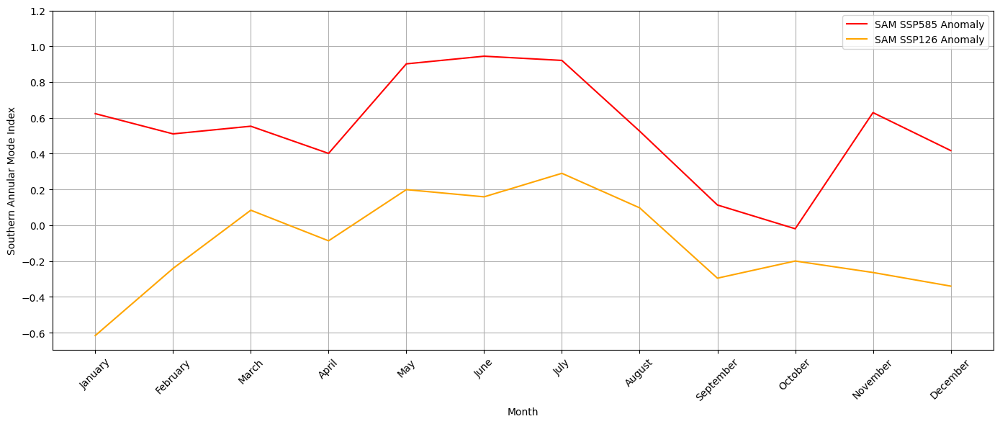

In [627]:
plt.figure(figsize=(14, 6))
plt.plot(SAM_Future_Mon_AvgAnom['Month'], SAM_Future_Mon_AvgAnom['SAM_585_Anom'], label='SSP585', color='red')
plt.plot(SAM_Future_Mon_AvgAnom['Month'], SAM_Future_Mon_AvgAnom['SAM_126_Anom'], label='SSP126', color='orange')

plt.grid(True)

plt.xlabel('Month')
plt.ylabel('Southern Annular Mode Index')
plt.title('')

plt.yticks(np.arange(-0.6, 1.3, 0.2))

plt.legend(['SAM SSP585 Anomaly', 'SAM SSP126 Anomaly'], loc='upper right')

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [628]:
sie_variables = [var for var in hist.variables if 'sic_sh' in var]
sie_variables

['sic_sh_extent_ann',
 'sic_sh_extent_climo',
 'sic_sh_extent_djf',
 'sic_sh_extent_feb',
 'sic_sh_extent_jja',
 'sic_sh_extent_mam',
 'sic_sh_extent_mar',
 'sic_sh_extent_mon',
 'sic_sh_extent_mon_anom',
 'sic_sh_extent_sep',
 'sic_sh_extent_son',
 'sic_sh_spatialmean_ann',
 'sic_sh_spatialmean_djf',
 'sic_sh_spatialmean_jja',
 'sic_sh_spatialmean_mam',
 'sic_sh_spatialmean_son',
 'sic_sh_spatialstddev_ann',
 'sic_sh_spatialstddev_djf',
 'sic_sh_spatialstddev_jja',
 'sic_sh_spatialstddev_mam',
 'sic_sh_spatialstddev_son',
 'sic_sh_trends_ann',
 'sic_sh_trends_djf',
 'sic_sh_trends_jja',
 'sic_sh_trends_mam',
 'sic_sh_trends_mon',
 'sic_sh_trends_son']

In [629]:
# hist
sie_var1 = 'sic_sh_extent_mon'
sie_hist_mon = hist[sie_var1]
sie_hist_mon

<xarray.DataArray 'sic_sh_extent_mon' (time: 1980)> Size: 8kB
[1980 values with dtype=float32]
Coordinates:
  * time     (time) object 16kB 1850-01-16 00:00:00 ... 2014-12-16 00:00:00
Attributes:
    i:               0
    j:               0
    standard_name:   sea_ice_area_fraction
    long_name:       Southern Hemisphere sic extent timeseries (monthly)
    comment:         Area fraction of grid cell covered by sea ice
    units:           10^12 m2
    original_name:   mo: (variable_name: aice)
    original_units:  1
    history:         2019-04-05T15:48:59Z altered by CMOR: Converted units fr...

In [630]:
# ssp126
sie_var2 = 'sic_sh_extent_mon'
sie_126_mon = ssp126hist[sie_var2]
sie_126_mon

<xarray.DataArray 'sic_sh_extent_mon' (time: 3012)> Size: 12kB
[3012 values with dtype=float32]
Coordinates:
  * time     (time) object 24kB 1850-01-16 00:00:00 ... 2100-12-16 00:00:00
Attributes:
    i:               0
    j:               0
    standard_name:   sea_ice_area_fraction
    long_name:       Southern Hemisphere sic extent timeseries (monthly)
    comment:         Area fraction of grid cell covered by sea ice
    units:           10^12 m2
    original_name:   mo: (variable_name: aice)
    original_units:  1
    history:         2019-04-05T15:48:59Z altered by CMOR: Converted units fr...

In [631]:
# ssp585
sie_var3 = 'sic_sh_extent_mon'
sie_585_mon = ssp585hist[sie_var3]
sie_585_mon

<xarray.DataArray 'sic_sh_extent_mon' (time: 3012)> Size: 12kB
[3012 values with dtype=float32]
Coordinates:
  * time     (time) object 24kB 1850-01-16 00:00:00 ... 2100-12-16 00:00:00
Attributes:
    i:               0
    j:               0
    standard_name:   sea_ice_area_fraction
    long_name:       Southern Hemisphere sic extent timeseries (monthly)
    comment:         Area fraction of grid cell covered by sea ice
    units:           10^12 m2
    original_name:   mo: (variable_name: aice)
    original_units:  1
    history:         2019-04-05T15:48:59Z altered by CMOR: Converted units fr...

In [632]:
sie_hist_df = sie_hist_mon.to_dataframe(name='SIE')

print(sie_hist_df)

                            SIE
time                           
1850-01-16 00:00:00 12.23012733
1850-02-16 00:00:00  5.96053743
1850-03-16 00:00:00  5.78352737
1850-04-16 00:00:00  9.14684582
1850-05-16 00:00:00 12.20355225
...                         ...
2014-08-16 00:00:00 15.40803623
2014-09-16 00:00:00 16.55298615
2014-10-16 00:00:00 17.07378769
2014-11-16 00:00:00 16.58267212
2014-12-16 00:00:00 14.55335999

[1980 rows x 1 columns]


In [633]:
datetime_index4 = [date.strftime('%Y-%m-%d') for date in sie_hist_df.index]

# indexing
sie_hist_df.index = pd.to_datetime(datetime_index4)

# time period 1981-2010
start_date = '1981-01-01'
end_date = '2010-12-31'
sie_hist_subset = sie_hist_df.loc[(sie_hist_df.index >= start_date) & (sie_hist_df.index <= end_date)]

sie_hist_subset.head(13)

,SIE
1981-01-16,10.63530445
1981-02-16,5.81457853
1981-03-16,5.40511990
1981-04-16,7.62568140
1981-05-16,10.18339920
1981-06-16,12.81801987
1981-07-16,15.36192608
1981-08-16,17.22631073
1981-09-16,18.39751434
1981-10-16,18.63126373


In [634]:
sie_hist_subset['Month'] = sie_hist_subset.index.month

# grouping by month, calc avg SIE
siemonthly_avg_hist = sie_hist_subset.groupby('Month')['SIE'].mean().reset_index()

# new df with SIE values
siemonthly_avg_hist = pd.DataFrame({
    'Month': siemonthly_avg_hist['Month'],
    'SIE_Mean': siemonthly_avg_hist['SIE']
})

siemonthly_avg_hist['Month'] = pd.to_datetime(siemonthly_avg_hist['Month'], format='%m').dt.strftime('%B')

siemonthly_avg_hist.head(13)

/var/folders/56/rbch6phs7x94kjh793wd365h0000gn/T/ipykernel_3177/2336148921.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sie_hist_subset['Month'] = sie_hist_subset.index.month


,Month,SIE_Mean
0,January,9.33259487
1,February,4.41522121
2,March,4.67090082
3,April,7.18156528
4,May,9.62437820
5,June,12.00942802
6,July,14.26184654
7,August,16.03820038
8,September,17.01509285
9,October,17.29129028


In [635]:
sie_126_df = sie_126_mon.to_dataframe(name='SIE')

print(sie_126_df)

                            SIE
time                           
1850-01-16 00:00:00 12.23012733
1850-02-16 00:00:00  5.96053743
1850-03-16 00:00:00  5.78352737
1850-04-16 00:00:00  9.14684582
1850-05-16 00:00:00 12.20355225
...                         ...
2100-08-16 00:00:00 13.78278923
2100-09-16 00:00:00 15.05802250
2100-10-16 00:00:00 15.62164879
2100-11-16 00:00:00 15.25558758
2100-12-16 00:00:00 13.73957348

[3012 rows x 1 columns]


In [636]:
datetime_index5 = [date.strftime('%Y-%m-%d') for date in sie_126_df.index]

# indexing
sie_126_df.index = pd.to_datetime(datetime_index5)

# time period 2071-2100
start_date = '2071-01-01'
end_date = '2100-12-31'
sie_126_subset = sie_126_df.loc[(sie_126_df.index >= start_date) & (sie_126_df.index <= end_date)]

sie_126_subset.head(13)

,SIE
2071-01-16,7.52336168
2071-02-16,2.56521964
2071-03-16,2.48362851
2071-04-16,4.97468948
2071-05-16,7.82909346
2071-06-16,10.42232227
2071-07-16,12.26821804
2071-08-16,14.03221226
2071-09-16,15.00434494
2071-10-16,15.36355495


In [637]:
sie_126_subset['Month'] = sie_126_subset.index.month

# grouping by month, calc avg SIE
siemonthly_avg_126 = sie_126_subset.groupby('Month')['SIE'].mean().reset_index()

# new df with month and average SIE
siemonthly_avg_126 = pd.DataFrame({
    'Month': siemonthly_avg_126['Month'],
    'SIE_Mean126': siemonthly_avg_126['SIE']
})

siemonthly_avg_126['Month'] = pd.to_datetime(siemonthly_avg_126['Month'], format='%m').dt.strftime('%B')

siemonthly_avg_126.head(13)

/var/folders/56/rbch6phs7x94kjh793wd365h0000gn/T/ipykernel_3177/1249773979.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sie_126_subset['Month'] = sie_126_subset.index.month


,Month,SIE_Mean126
0,January,7.87604380
1,February,3.04465532
2,March,3.09074831
3,April,5.48809719
4,May,8.23301697
5,June,10.57714748
6,July,12.62586117
7,August,14.34796524
8,September,15.50942898
9,October,15.91097164


In [638]:
sie_585_df = sie_585_mon.to_dataframe(name='SIE')

print(sie_585_df)

                            SIE
time                           
1850-01-16 00:00:00 12.23012733
1850-02-16 00:00:00  5.96053743
1850-03-16 00:00:00  5.78352737
1850-04-16 00:00:00  9.14684582
1850-05-16 00:00:00 12.20355225
...                         ...
2100-08-16 00:00:00  6.94596052
2100-09-16 00:00:00  7.83694410
2100-10-16 00:00:00  8.21952057
2100-11-16 00:00:00  7.82087612
2100-12-16 00:00:00  5.21227217

[3012 rows x 1 columns]


In [639]:
datetime_index6 = [date.strftime('%Y-%m-%d') for date in sie_585_df.index]

# indexing
sie_585_df.index = pd.to_datetime(datetime_index6)

# time period 2071-2100
start_date = '2071-01-01'
end_date = '2100-12-31'
sie_585_subset = sie_585_df.loc[(sie_585_df.index >= start_date) & (sie_585_df.index <= end_date)]

sie_585_subset.head(13)

,SIE
2071-01-16,4.17915201
2071-02-16,1.21210206
2071-03-16,1.19625378
2071-04-16,2.87761664
2071-05-16,4.82370186
2071-06-16,7.01179457
2071-07-16,8.80984116
2071-08-16,10.67185593
2071-09-16,11.87229538
2071-10-16,12.47557449


In [640]:
sie_585_subset['Month'] = sie_585_subset.index.month

# grouping by month, calc avg SIE
siemonthly_avg_585 = sie_585_subset.groupby('Month')['SIE'].mean().reset_index()

# new df with month and average SIE
siemonthly_avg_585 = pd.DataFrame({
    'Month': siemonthly_avg_585['Month'],
    'SIE_Mean585': siemonthly_avg_585['SIE']
})

siemonthly_avg_585['Month'] = pd.to_datetime(siemonthly_avg_585['Month'], format='%m').dt.strftime('%B')

siemonthly_avg_585.head(13)

/var/folders/56/rbch6phs7x94kjh793wd365h0000gn/T/ipykernel_3177/4041618312.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sie_585_subset['Month'] = sie_585_subset.index.month


,Month,SIE_Mean585
0,January,2.78652954
1,February,0.51037782
2,March,0.60304558
3,April,1.95375776
4,May,3.77301884
5,June,5.65213013
6,July,7.26414585
7,August,8.67757225
8,September,9.67798328
9,October,10.11370468


In [641]:
# merging dfs across month
sie_mon_avgf = pd.merge(siemonthly_avg_hist, siemonthly_avg_585, on='Month')
sie_mon_avgf = pd.merge(sie_mon_avgf, siemonthly_avg_126, on='Month')

# renaming columns
sie_mon_avgf = sie_mon_avgf.rename(columns={'SIE_Mon_Mean': 'SIE_Hist', 'SIE_': 'SAM_585', 'SAM_PC_y': 'SAM_126'})

sie_mon_avgf.head(13)

,Month,SIE_Mean,SIE_Mean585,SIE_Mean126
0,January,9.33259487,2.78652954,7.87604380
1,February,4.41522121,0.51037782,3.04465532
2,March,4.67090082,0.60304558,3.09074831
3,April,7.18156528,1.95375776,5.48809719
4,May,9.62437820,3.77301884,8.23301697
5,June,12.00942802,5.65213013,10.57714748
6,July,14.26184654,7.26414585,12.62586117
7,August,16.03820038,8.67757225,14.34796524
8,September,17.01509285,9.67798328,15.50942898
9,October,17.29129028,10.11370468,15.91097164


In [642]:
# SIE_585 - SIE_Hist for each month
sie_mon_avgf['SIE_585_Anom'] = sie_mon_avgf['SIE_Mean585'] - sie_mon_avgf['SIE_Mean']

# SIE_126 - SIE_Hist for each month
sie_mon_avgf['SIE_126_Anom'] = sie_mon_avgf['SIE_Mean126'] - sie_mon_avgf['SIE_Mean']

# new df with Month column and calcd avgs
SIE_Future_Mon_AvgAnom = pd.DataFrame({
    'Month': sie_mon_avgf['Month'],
    'SIE_585_Anom': sie_mon_avgf['SIE_585_Anom'],
    'SIE_126_Anom': sie_mon_avgf['SIE_126_Anom']
})

print(SIE_Future_Mon_AvgAnom.head)

<bound method NDFrame.head of         Month  SIE_585_Anom  SIE_126_Anom
0     January   -6.54606533   -1.45655107
1    February   -3.90484333   -1.37056589
2       March   -4.06785536   -1.58015251
3       April   -5.22780752   -1.69346809
4         May   -5.85135937   -1.39136124
5        June   -6.35729790   -1.43228054
6        July   -6.99770069   -1.63598537
7      August   -7.36062813   -1.69023514
8   September   -7.33710957   -1.50566387
9     October   -7.17758560   -1.38031864
10   November   -6.94395161   -1.16852665
11   December   -7.21696520   -1.19498253>


In [643]:
SAM_SIE_Anom_df = pd.merge(SAM_Future_Mon_AvgAnom, SIE_Future_Mon_AvgAnom, on='Month')

print(SAM_SIE_Anom_df)

        Month  SAM_585_Anom  SAM_126_Anom  SIE_585_Anom  SIE_126_Anom
0     January    0.62345302   -0.61625296   -6.54606533   -1.45655107
1    February    0.51043344   -0.24126095   -3.90484333   -1.37056589
2       March    0.55322194    0.08404139   -4.06785536   -1.58015251
3       April    0.40132418   -0.08694173   -5.22780752   -1.69346809
4         May    0.90162152    0.19903511   -5.85135937   -1.39136124
5        June    0.94433975    0.15879482   -6.35729790   -1.43228054
6        July    0.92079628    0.29015291   -6.99770069   -1.63598537
7      August    0.52551389    0.09721491   -7.36062813   -1.69023514
8   September    0.11325207   -0.29563826   -7.33710957   -1.50566387
9     October   -0.01954883   -0.19978300   -7.17758560   -1.38031864
10   November    0.62922305   -0.26394749   -6.94395161   -1.16852665
11   December    0.41724172   -0.34007654   -7.21696520   -1.19498253


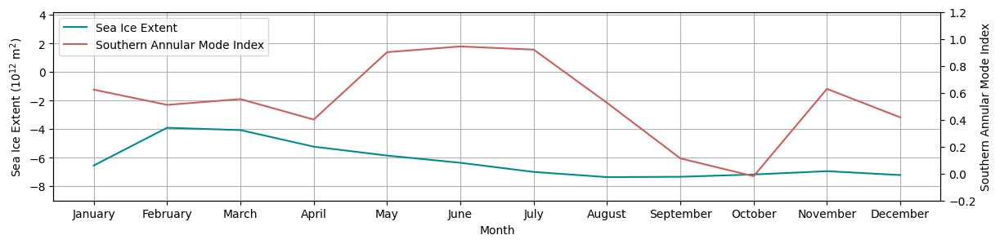

In [644]:
fig, ax1 = plt.subplots(figsize=(14, 3))

sie_585_anom_line, = ax1.plot(SAM_SIE_Anom_df['Month'], SAM_SIE_Anom_df['SIE_585_Anom'], color='darkcyan', label='SIE_585_Anom')
ax1.set_ylabel('Sea Ice Extent ($10^{12}$ m$^2$)')

ax2 = ax1.twinx()

sam_585_anom_line, = ax2.plot(SAM_SIE_Anom_df['Month'], SAM_SIE_Anom_df['SAM_585_Anom'], color='indianred', label='SAM_585_Anom')
ax2.set_ylabel('Southern Annular Mode Index')

ax1.set_xlabel('Month')

ax1.set_ylim(-9.0, 4.2)
ax2.set_ylim(-0.2, 1.2)

legend_handles = [sie_585_anom_line, sam_585_anom_line]
legend_labels = ['Sea Ice Extent', 'Southern Annular Mode Index']
ax1.legend(legend_handles, legend_labels, loc='upper left')

ax1.grid(True)

plt.show()

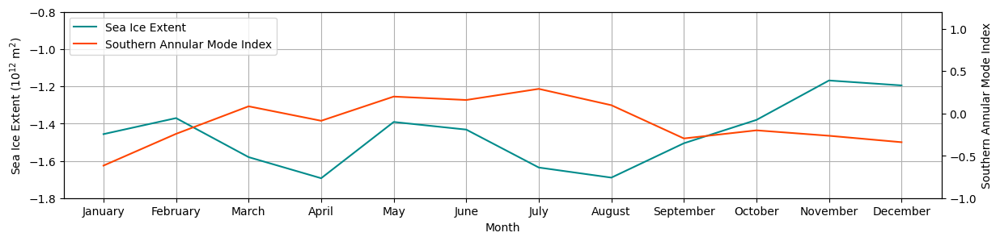

In [645]:
fig, ax1 = plt.subplots(figsize=(14, 3))

sie_126_anom_line, = ax1.plot(SAM_SIE_Anom_df['Month'], SAM_SIE_Anom_df['SIE_126_Anom'], color='darkcyan', label='SIE_126_Anom')
ax1.set_ylabel('Sea Ice Extent ($10^{12}$ m$^2$)')

ax2 = ax1.twinx()

sam_126_anom_line, = ax2.plot(SAM_SIE_Anom_df['Month'], SAM_SIE_Anom_df['SAM_126_Anom'], color='orangered', label='SAM_126_Anom')
ax2.set_ylabel('Southern Annular Mode Index')

ax1.set_xlabel('Month')

ax1.set_ylim(-1.8, -0.8)
ax2.set_ylim(-1.0, 1.2)

legend_handles = [sie_126_anom_line, sam_126_anom_line]
legend_labels = ['Sea Ice Extent', 'Southern Annular Mode Index']
ax1.legend(legend_handles, legend_labels, loc='upper left')

ax1.grid(True)

plt.show()

## Redo: Figure 2a - Plotting TAS and SST Regressed with SAM as timeseries

In [646]:
sam_vars

['sam_ann',
 'sam_djf',
 'sam_jja',
 'sam_mam',
 'sam_mon',
 'sam_pr_regression_ann',
 'sam_pr_regression_djf',
 'sam_pr_regression_jja',
 'sam_pr_regression_mam',
 'sam_pr_regression_mon',
 'sam_pr_regression_son',
 'sam_son',
 'sam_sst_regression_ann',
 'sam_sst_regression_djf',
 'sam_sst_regression_jja',
 'sam_sst_regression_mam',
 'sam_sst_regression_mon',
 'sam_sst_regression_son',
 'sam_tas_regression_ann',
 'sam_tas_regression_djf',
 'sam_tas_regression_jja',
 'sam_tas_regression_mam',
 'sam_tas_regression_mon',
 'sam_tas_regression_son',
 'sam_timeseries_ann',
 'sam_timeseries_djf',
 'sam_timeseries_jja',
 'sam_timeseries_mam',
 'sam_timeseries_mon',
 'sam_timeseries_son']

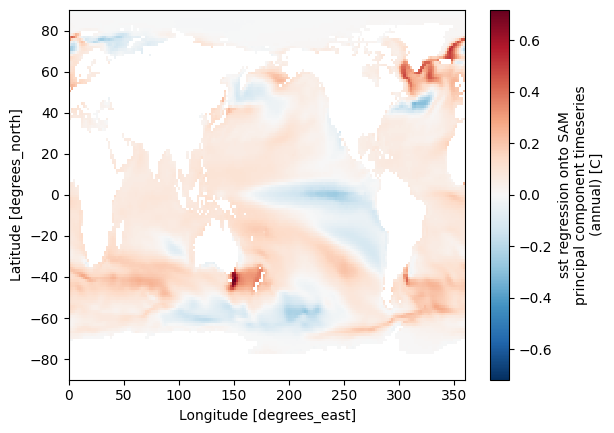

In [647]:
sam_var10 = 'sam_sst_regression_ann'
sam_sst_reg_hist = hist[sam_var10]
sam_sst_reg_hist.plot()

In [648]:
sie_126_df2 = sie_126_mon.to_dataframe(name='SIE126')

sie_126_df2.head(13)

,SIE126
time,
1850-01-16 00:00:00,12.23012733
1850-02-16 00:00:00,5.96053743
1850-03-16 00:00:00,5.78352737
1850-04-16 00:00:00,9.14684582
1850-05-16 00:00:00,12.20355225
1850-06-16 00:00:00,14.83434963
1850-07-16 00:00:00,17.16226387
1850-08-16 00:00:00,18.70996475
1850-09-16 00:00:00,19.67165565


In [649]:
sam_126_df2 = sam_ssp126_trend.to_dataframe(name='SAM126')

sam_126_df2.head(13)

,SAM126
time,
1850-01-16 00:00:00,-1.71153176
1850-02-16 00:00:00,-1.07809186
1850-03-16 00:00:00,-0.05102446
1850-04-16 00:00:00,-0.04603723
1850-05-16 00:00:00,1.34374928
1850-06-16 00:00:00,0.52156848
1850-07-16 00:00:00,0.61335725
1850-08-16 00:00:00,0.50424397
1850-09-16 00:00:00,0.54933143


In [650]:
sam_sie_df = pd.merge(sie_126_df2, sam_126_df2, left_index=True, right_index=True)

# time as seperate column
sam_sie_df.reset_index(inplace=True)

print(sam_sie_df)

                     time      SIE126      SAM126
0     1850-01-16 00:00:00 12.23012733 -1.71153176
1     1850-02-16 00:00:00  5.96053743 -1.07809186
2     1850-03-16 00:00:00  5.78352737 -0.05102446
3     1850-04-16 00:00:00  9.14684582 -0.04603723
4     1850-05-16 00:00:00 12.20355225  1.34374928
...                   ...         ...         ...
3007  2100-08-16 00:00:00 13.78278923  2.45323372
3008  2100-09-16 00:00:00 15.05802250  0.81326926
3009  2100-10-16 00:00:00 15.62164879  1.37839782
3010  2100-11-16 00:00:00 15.25558758  0.87631488
3011  2100-12-16 00:00:00 13.73957348  1.17543721

[3012 rows x 3 columns]


In [651]:
# making new df
sam_sie_df['time'] = pd.to_datetime(sam_sie_df['time'].astype(str))

sam_sie_df['Year'] = sam_sie_df['time'].dt.year

# grouping by year with max SIE126 value within each year
max_sie_idx = sam_sie_df.groupby('Year')['SIE126'].idxmax()

# new df with max SIE126 and corresponding SAM126 value
MaxSIE_SAM_df = sam_sie_df.loc[max_sie_idx, ['Year', 'SIE126', 'SAM126']]

print(MaxSIE_SAM_df)

      Year      SIE126      SAM126
9     1850 19.85083199  0.15437557
21    1851 19.68762398  1.12091231
32    1852 20.04895973 -0.57355195
45    1853 19.19723892  0.72600621
57    1854 19.27167702 -0.10776374
...    ...         ...         ...
2961  2096 16.88140488 -1.96001780
2973  2097 16.72961998  1.64975250
2985  2098 15.98593903  0.21652356
2997  2099 16.07798004 -1.42143738
3009  2100 15.62164879  1.37839782

[251 rows x 3 columns]


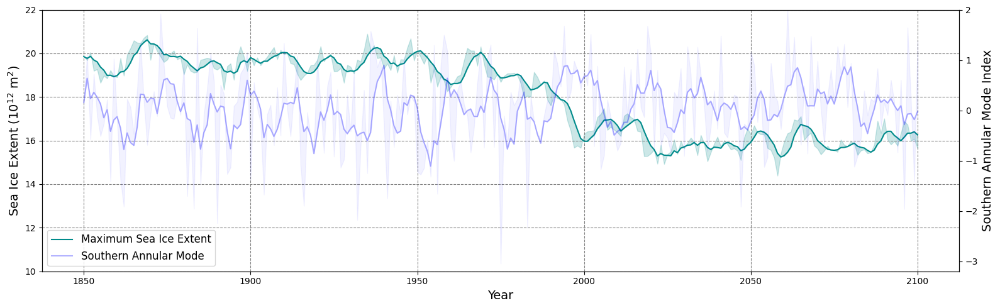

In [652]:
MaxSIE_SAM_df['SIE126_rolling'] = MaxSIE_SAM_df['SIE126'].rolling(window=5, min_periods=1).mean()
MaxSIE_SAM_df['SAM126_rolling'] = MaxSIE_SAM_df['SAM126'].rolling(window=5, min_periods=1).mean()

fig, ax1 = plt.subplots(figsize=(16, 5))

# rolling averages
line1, = ax1.plot(MaxSIE_SAM_df['Year'], MaxSIE_SAM_df['SIE126_rolling'], color='darkcyan', label='Maximum Sea Ice Extent', alpha=1)

# shaded areas as raw data
ax1.fill_between(MaxSIE_SAM_df['Year'], MaxSIE_SAM_df['SIE126'], MaxSIE_SAM_df['SIE126_rolling'], color='darkcyan', alpha=0.2)

ax1.set_xlabel('Year', fontsize=14)
ax1.set_ylabel('Sea Ice Extent ($10^{12}$ m$^2$)', color='black', fontsize=14)
ax1.tick_params(axis='y', labelcolor='black')

ax1.set_yticks(range(10, 23, 2))

ax1.set_ylim(10, 22)

ax2 = ax1.twinx()
line2, = ax2.plot(MaxSIE_SAM_df['Year'], MaxSIE_SAM_df['SAM126_rolling'], color='blue', label='Southern Annular Mode', alpha=0.3)

ax2.fill_between(MaxSIE_SAM_df['Year'], MaxSIE_SAM_df['SAM126'], MaxSIE_SAM_df['SAM126_rolling'], color='blue', alpha=0.05)

ax2.set_ylabel('Southern Annular Mode Index', color='black', fontsize=14)
ax2.tick_params(axis='y', labelcolor='black')

ax2.set_ylim(-3.2, 2)

ax1.grid(axis='y', color='gray', linestyle='--')
ax1.grid(axis='x', color='gray', linestyle='--')

lines = [line1, line2]
labels = [line.get_label() for line in lines]

ax1.legend(lines, labels, loc='lower left', fontsize=12)

fig.tight_layout()
plt.show()

In [653]:
sie_585_df3 = sie_585_mon.to_dataframe(name='SIE585')

print(sie_585_df3.head)

<bound method NDFrame.head of                          SIE585
time                           
1850-01-16 00:00:00 12.23012733
1850-02-16 00:00:00  5.96053743
1850-03-16 00:00:00  5.78352737
1850-04-16 00:00:00  9.14684582
1850-05-16 00:00:00 12.20355225
...                         ...
2100-08-16 00:00:00  6.94596052
2100-09-16 00:00:00  7.83694410
2100-10-16 00:00:00  8.21952057
2100-11-16 00:00:00  7.82087612
2100-12-16 00:00:00  5.21227217

[3012 rows x 1 columns]>


In [654]:
sam_585_df3 = sam_ssp585_trend.to_dataframe(name='SAM585')

print(sam_585_df3.head)

<bound method NDFrame.head of                          SAM585
time                           
1850-01-16 00:00:00 -1.76128161
1850-02-16 00:00:00 -1.19270921
1850-03-16 00:00:00 -0.18938205
1850-04-16 00:00:00 -0.22987233
1850-05-16 00:00:00  1.10268128
...                         ...
2100-08-16 00:00:00  0.85651135
2100-09-16 00:00:00 -0.23114203
2100-10-16 00:00:00  1.02645659
2100-11-16 00:00:00  1.14802182
2100-12-16 00:00:00 -0.35143641

[3012 rows x 1 columns]>


In [656]:
sam_sie_df3 = pd.merge(sie_585_df3, sam_585_df3, left_index=True, right_index=True)

# indexing
sam_sie_df3.reset_index(inplace=True)

print(sam_sie_df3)

                     time      SIE585      SAM585
0     1850-01-16 00:00:00 12.23012733 -1.76128161
1     1850-02-16 00:00:00  5.96053743 -1.19270921
2     1850-03-16 00:00:00  5.78352737 -0.18938205
3     1850-04-16 00:00:00  9.14684582 -0.22987233
4     1850-05-16 00:00:00 12.20355225  1.10268128
...                   ...         ...         ...
3007  2100-08-16 00:00:00  6.94596052  0.85651135
3008  2100-09-16 00:00:00  7.83694410 -0.23114203
3009  2100-10-16 00:00:00  8.21952057  1.02645659
3010  2100-11-16 00:00:00  7.82087612  1.14802182
3011  2100-12-16 00:00:00  5.21227217 -0.35143641

[3012 rows x 3 columns]


In [657]:
# new df
sam_sie_df3['time'] = pd.to_datetime(sam_sie_df3['time'].astype(str))

sam_sie_df3['Year'] = sam_sie_df3['time'].dt.year

# grouping by year, finding max SIE126 value within each year
max_sie_idx2 = sam_sie_df3.groupby('Year')['SIE585'].idxmax()

# new df with max SIE126 and corresponding SAM126 value
MaxSIE_SAM_df2 = sam_sie_df3.loc[max_sie_idx2, ['Year', 'SIE585', 'SAM585']]

print(MaxSIE_SAM_df2)

      Year      SIE585      SAM585
9     1850 19.85083199 -0.04442966
21    1851 19.68762398  0.89632261
32    1852 20.04895973 -0.65922678
45    1853 19.19723892  0.55649096
57    1854 19.27167702 -0.32902458
...    ...         ...         ...
2961  2096  7.67325163  0.73480016
2973  2097  7.83639479  0.41064364
2985  2098  7.65883303  0.63696980
2997  2099  8.01163864  1.29316807
3009  2100  8.21952057  1.02645659

[251 rows x 3 columns]


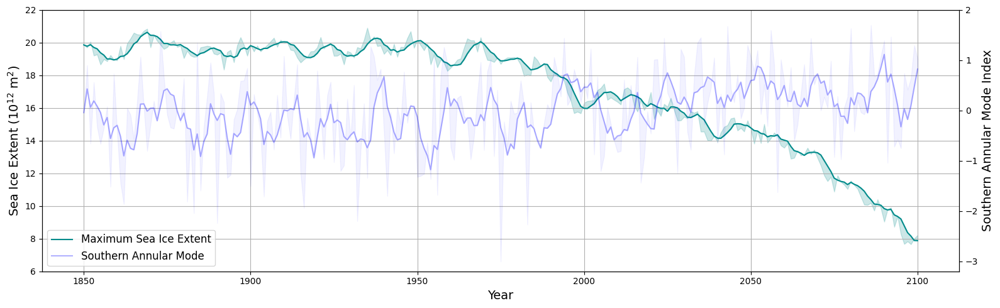

In [658]:
# plotting
MaxSIE_SAM_df2['SIE585_rolling'] = MaxSIE_SAM_df2['SIE585'].rolling(window=5, min_periods=1).mean()
MaxSIE_SAM_df2['SAM585_rolling'] = MaxSIE_SAM_df2['SAM585'].rolling(window=5, min_periods=1).mean()

fig, ax1 = plt.subplots(figsize=(16, 5))

line1, = ax1.plot(MaxSIE_SAM_df2['Year'], MaxSIE_SAM_df2['SIE585_rolling'], color='darkcyan', label='Maximum Sea Ice Extent', alpha=1)

ax1.fill_between(MaxSIE_SAM_df2['Year'], MaxSIE_SAM_df2['SIE585'], MaxSIE_SAM_df2['SIE585_rolling'], color='darkcyan', alpha=0.2)

ax1.set_xlabel('Year', fontsize=14)
ax1.set_ylabel('Sea Ice Extent ($10^{12}$ m$^2$)', color='black', fontsize=14)
ax1.tick_params(axis='y', labelcolor='black')

ax1.set_ylim(6, 22)

ax2 = ax1.twinx()
line2, = ax2.plot(MaxSIE_SAM_df2['Year'], MaxSIE_SAM_df2['SAM585_rolling'], color='blue', label='Southern Annular Mode', alpha=0.3)

ax2.fill_between(MaxSIE_SAM_df2['Year'], MaxSIE_SAM_df2['SAM585'], MaxSIE_SAM_df2['SAM585_rolling'], color='blue', alpha=0.05)

ax2.set_ylabel('Southern Annular Mode Index', color='black', fontsize=14)
ax2.tick_params(axis='y', labelcolor='black')

ax2.set_ylim(-3.2, 2)

ax1.grid(axis='y')
ax1.grid(axis='x')

lines = [line1, line2]
labels = [line.get_label() for line in lines]

ax1.legend(lines, labels, loc='lower left', fontsize=12)

fig.tight_layout()
plt.show()